## Retail - PGP .
$ Course-end Project 1$ 

$ Description$ 
##  Problem Statement
•	It is a critical requirement for business to understand the value derived from a customer. RFM is a method used for analyzing customer value.
•	Customer segmentation is the practice of segregating the customer base into groups of individuals based on some common characteristics such as age, gender, interests, and spending habits
•	Perform customer segmentation using RFM analysis. The resulting segments can be ordered from most valuable (highest recency, frequency, and value) to least valuable (lowest recency, frequency, and value).
Dataset Description
This is a transnational data set which contains all the transactions that occurred between 01/12/2010 and 09/12/2011 for a UK-based and registered non-store online retail. The company mainly sells unique and all-occasion gifts.
Variables	Description
InvoiceNo	Invoice number. Nominal, a six digit integral number uniquely assigned to each transaction. If this code starts with letter 'c', it indicates a cancellation
StockCode	Product (item) code. Nominal, a five digit integral number uniquely assigned to each distinct product
Description	Product (item) name. Nominal
Quantity	The quantities of each product (item) per transaction. Numeric
InvoiceDate	Invoice Date and time. Numeric, the day and time when each transaction was generated
UnitPrice	Unit price. Numeric, product price per unit in sterling
CustomerID	Customer number. Nominal, a six digit integral number uniquely assigned to each customer
Country	Country name. Nominal, the name of the country where each customer resides



In [1]:
# Import th import libraries

In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import matplotlib
warnings.filterwarnings('ignore')

Import several python libraries for graphs and understanding of data:
* 𝑝𝑎𝑛𝑑𝑎𝑠𝑝𝑟𝑜𝑓𝑖𝑙𝑖𝑛𝑔:
  This library provides functionality for generating profile reports from pandas DataFrame objects. These reports include statistics, data types, missing values, and more, making it useful for data exploration and analysis.
 
 * 𝑝𝑙𝑜𝑡𝑙𝑦𝑒𝑥𝑝𝑟𝑒𝑠𝑠:
 Plotly Express is a high-level interface for creating interactive visualizations using Plotly, a popular plotting library. It simplifies the process of creating complex visualizations with minimal code.



In [3]:
!pip install pandas_profiling
!pip install plotly
!pip install kneed

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.
Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


In [4]:
import pandas_profiling
import plotly.express as px

In [5]:
# lets import the file online retail
retail_data =pd.read_excel("Online Retail.xlsx")
retail_data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom



# Data Cleaning:
$ Project Task:$  
$ Data Modeling :$ 



# 1. Perform a preliminary data inspection and data cleaning.


In [6]:
retail_data.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


$Interpretation:$ The quantiy that customer paid unit price approxamilty 9.552 that is around 18287 customer paid the unit price.


In [7]:
retail_data.shape

(541909, 8)

In [8]:
retail_data.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country'],
      dtype='object')

In [9]:
retail_data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 541909 entries, 0 to 541908
Data columns (total 8 columns):
 #   Column       Non-Null Count   Dtype         
---  ------       --------------   -----         
 0   InvoiceNo    541909 non-null  object        
 1   StockCode    541909 non-null  object        
 2   Description  540455 non-null  object        
 3   Quantity     541909 non-null  int64         
 4   InvoiceDate  541909 non-null  datetime64[ns]
 5   UnitPrice    541909 non-null  float64       
 6   CustomerID   406829 non-null  float64       
 7   Country      541909 non-null  object        
dtypes: datetime64[ns](1), float64(2), int64(1), object(4)
memory usage: 33.1+ MB


In [10]:
# Normally we can determine the missing data as given below:
retail_data.isnull().sum()

InvoiceNo           0
StockCode           0
Description      1454
Quantity            0
InvoiceDate         0
UnitPrice           0
CustomerID     135080
Country             0
dtype: int64

$ Interpretation:$ we can observe that the Description and customer Id has around 1454 and 135080 null values. lets get rid of it as description and customer ID has no impact on quantity and unit price prediction

# a. Check for missing data and formulate an apt strategy to treat them

In [11]:
# this code helps us to determine the missing values with the type of data and column in a very formatted way:
columntype =['Categorical','Categorical','Categorical','Descrete','Date','Continuous','Categorical','Categorical']
missingdf= pd.DataFrame({'Columns':retail_data.columns.to_list(),'Type of Data':columntype,'Number of Missing Values':retail_data.isna().sum()})
def highlight_max(s):
    is_max=s
    return['background-color:pink' if v else ''for v in is_max]
missingdf.style.apply(highlight_max,subset=['Number of Missing Values'])
missingdf.style.hide_index()

Columns,Type of Data,Number of Missing Values
InvoiceNo,Categorical,0
StockCode,Categorical,0
Description,Categorical,1454
Quantity,Descrete,0
InvoiceDate,Date,0
UnitPrice,Continuous,0
CustomerID,Categorical,135080
Country,Categorical,0


In [12]:
# Alternative way to find the data usinf profile_report which gives duplicate ,missing values and variable types: 
retail_data.profile_report()

Summarize dataset:   0%|          | 0/22 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

$ Interpretation:$ 
1. we have observed that description column has 1454 missing values and customerID has 135080 values, as the customer ID has no significance impact on the data, hence we can drop it.

2. The Description is Null will be automatically treated when discarding records while missing values of customer ID.

In [13]:
print("Number of records before dropping customer ID columns")
print(len(retail_data))
retail_data.drop(retail_data[retail_data['CustomerID'].isna()].index,inplace=True)
retail_data.reset_index(drop=True)
print("Number of records after dropping customr ID columns")
print(len(retail_data))
print("Is there any missing data in Description Column afterdropping the Null CustomerID columns")
print(any(retail_data['Description'].isna()==True))
missingdf=pd.DataFrame({'Columns':retail_data.columns.to_list(),'Number of Missing Values after cleaning':retail_data.isna().sum()})
missingdf.style.hide_index()

Number of records before dropping customer ID columns
541909
Number of records after dropping customr ID columns
406829
Is there any missing data in Description Column afterdropping the Null CustomerID columns
False


Columns,Number of Missing Values after cleaning
InvoiceNo,0
StockCode,0
Description,0
Quantity,0
InvoiceDate,0
UnitPrice,0
CustomerID,0
Country,0


$ Interpretation:$ Hence the value of missing data has been rectified.

## b. Remove duplicate data records.


In [14]:
print("Number of records before dropping the dupicate records")
print(len(retail_data))
retail_data.drop_duplicates(inplace=True)
retail_data.reset_index(drop=True)
print("Number of records after dropping the duplicate records")
print(len(retail_data))

Number of records before dropping the dupicate records
406829
Number of records after dropping the duplicate records
401604


In [15]:
# lets remove the transaction of the last month in year 2011. 
#as they have only data for 9 days.
import datetime
def get_month(x):
    return datetime.datetime(x.year,x.month,x.day)
print("Number of records before dropping the transaction of te last month")
print(len(retail_data))

Number of records before dropping the transaction of te last month
401604


In [16]:
# lets create InvoiceMonth column
retail_data['InvoiceMonth']=retail_data['InvoiceDate'].apply(get_month)
retail_data[retail_data['InvoiceMonth']>datetime.datetime(2011,11,30)]
retail_data.drop(retail_data[retail_data['InvoiceMonth']>datetime.datetime(2011,11,30)].index,inplace=True)
retail_data.reset_index(drop=True)
print("Number of records after dropping the transactions of the last ")
print(len(retail_data))

Number of records after dropping the transactions of the last 
384222


# c. Perform descriptive analytics on the given data.


Lets observe the countries that have most of the customers residing: 

In [17]:
retail_data.Country.value_counts(normalize=True).head(10).mul(100).round(2).astype(str)+'%'

United Kingdom    88.73%
Germany            2.38%
France             2.12%
EIRE               1.86%
Spain              0.64%
Netherlands        0.59%
Belgium            0.51%
Switzerland        0.49%
Portugal           0.36%
Australia          0.33%
Name: Country, dtype: object

$Interpretation:$ UK has 88%  customer has done more transaction than oher countries.

# Lets Visualize the invoiceDate in 2010 and 2011

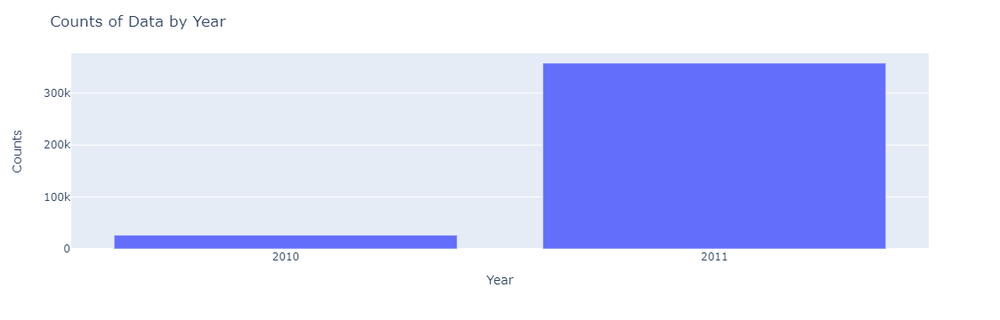

In [18]:
import plotly.express as px

yearly_counts = retail_data['InvoiceDate'].dt.year.value_counts(sort=False)

fig = px.bar(x=yearly_counts.index, y=yearly_counts.values)
fig.update_layout(
    xaxis_title="Year",
    yaxis_title="Counts",
    title="Counts of Data by Year",
    xaxis=dict(tickmode='array', tickvals=list(yearly_counts.index), ticktext=list(yearly_counts.index))
)

fig.show()





# Lets Visualize the customer trend on monthly basis in the year 2011

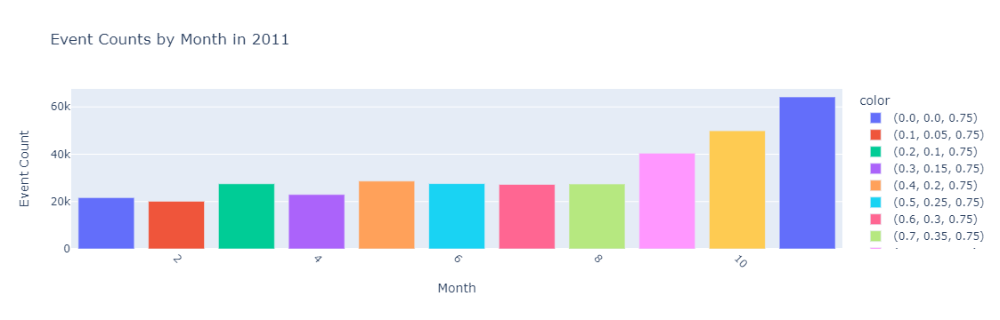

In [19]:
import plotly.express as px

# Create a DataFrame containing the data for the year 2011
data_2011= retail_data[retail_data.InvoiceDate.dt.year==2011]
# Calculate the counts of events for each month in 2011
monthly_counts =data_2011.InvoiceDate.dt.month.value_counts(sort=False)
# Define the colors for the bars
my_colors=[(x/10.0,x/20.0,0.75) for x in range (len(monthly_counts))]

# Create the bar chart using Plotly Express
fig =px.bar(
x=monthly_counts.index,#Monthly(x-axis)
y= monthly_counts.values,#counts(y-axis)
color=my_colors,#custom colors
labels={'x':'Month','y':'Event Count'},
title='Event Counts by Month in 2011')

# Rotate x-axis labels for better readability
fig.update_xaxes(tickangle=45)
# Show the plot
fig.show()

# Visualize the items Contributing to maximum Price Value:

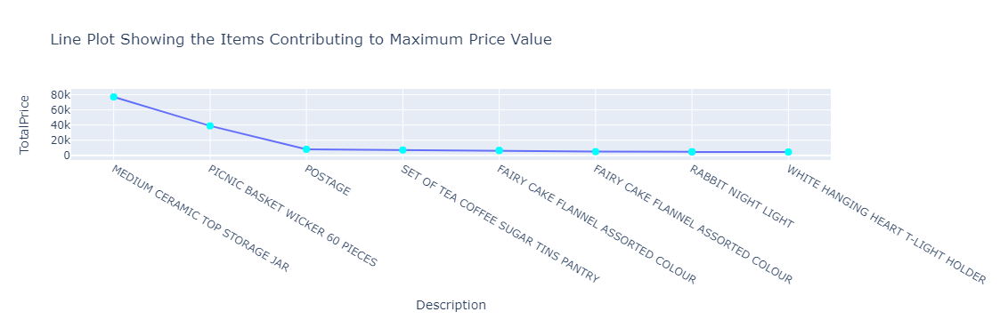

In [20]:
import plotly.express as px

# Calculate TotalPrice
retail_data['TotalPrice'] = retail_data['Quantity'] * retail_data['UnitPrice']

# Sort and select the top 10 TotalPrice values
top_10_data = retail_data.sort_values(by='TotalPrice', ascending=False).head(10)

# Create a line plot using Plotly Express
fig = px.line(top_10_data, x='Description', y='TotalPrice', markers=True, line_shape='linear', title='Line Plot Showing the Items Contributing to Maximum Price Value')
fig.update_traces(marker=dict(color='cyan', size=8))
fig.update_layout(xaxis=dict(tickmode='array', tickvals=list(range(10)), ticktext=top_10_data['Description']))

# Show the plot
fig.show()

$ Interpretation: $ item name medium Ceremic Top Storage Jar has highest retail approx 771836k.

Let us explore more data in retailing the item in countries.

In [21]:
print("First Business transaction date is{}".format(retail_data.InvoiceDate.min()))
print("Last Business transaction date is{}".format(retail_data.InvoiceDate.max()))

First Business transaction date is2010-12-01 08:26:00
Last Business transaction date is2011-11-30 17:42:00


In [22]:
monthly_gross =retail_data[retail_data.InvoiceDate.dt.year==2011].groupby(retail_data.InvoiceDate.dt.month).TotalPrice.sum()
df =pd.DataFrame(monthly_gross)
df.index.name='Invoice Month'
df

,TotalPrice
Invoice Month,
1,473731.900
2,435534.070
3,578576.210
4,425222.671
5,647011.670
6,606862.520
7,573112.321
8,615078.090
9,929356.232


$Interpretation:$ by the end of the year approximately we have 1126815.070 transactions that has happpend.

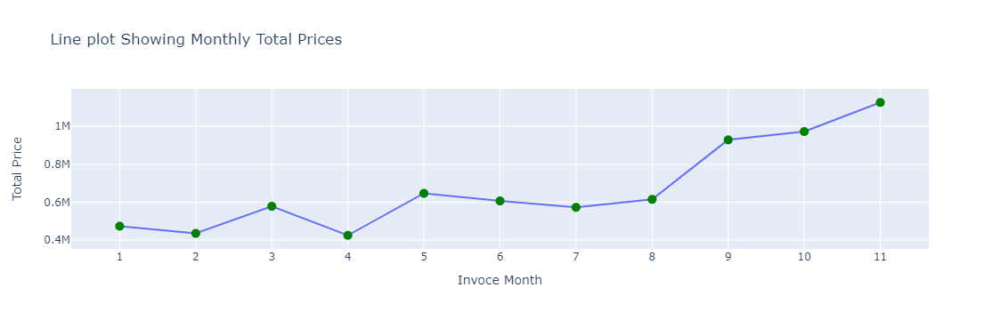

In [23]:
#Lets plot the above graph:
import plotly.express as px
# create a DataFrame 
data =pd.DataFrame({'Invoice Month':monthly_gross.index,'Total Price':monthly_gross.values})
# create the line plot using plotly express
fig=px.line(data,x='Invoice Month',y='Total Price',
           markers=True,line_shape='linear',title='Line plot Showing Monthly Total Prices',
           labels={'Total Price':'Total Price','Invoice Month': 'Invoce Month'})
# Customize the Layout
fig.update_traces(marker=dict(color='green',size=10))
fig.update_xaxes(tickvals=list(range(1,13)))
fig.show();

Note: In this code:

We create a DataFrame (df) from your monthly_gross Pandas Series, with 'Invoice Month' as the column for months and 'Total Price' as the column for total prices.

We use Plotly Express to create the line plot. We specify the data, x-axis, y-axis, markers, line shape, title, and label names.

We customize the marker color to green, the marker size, and the x-axis tick values to match the months.

Finally, we show the plot using fig.show(). This code will produce a line plot similar to the one created with Seaborn and Matplotlib, but using Plotly Express.







$Interpretation:$ There is a hike in the 11th month sales.

Lets Visualize some top product from the whole range:

In [24]:
retail_data.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'InvoiceMonth', 'TotalPrice'],
      dtype='object')

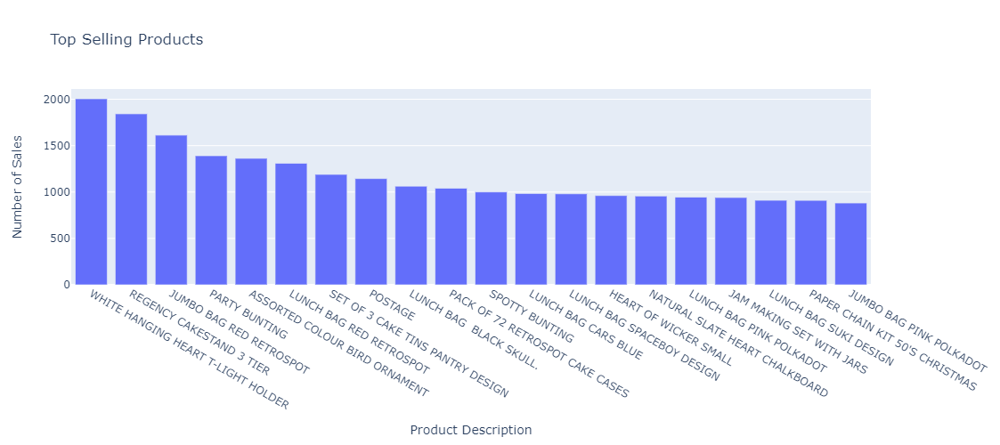

In [25]:
import plotly.express as px
top_products =retail_data['Description'].value_counts()[:20]
# Create a DataFrame from the Pandas Series for Plotly Express
df = pd.DataFrame({'Product Description': top_products.index, 'Count': top_products.values})

# Create the bar plot using Plotly Express
fig = px.bar(
    df, x='Product Description', y='Count',
    labels={'Count': 'Number of Sales', 'Product Description': 'Product Description'},
    title='Top Selling Products',
)

# Set the size of the figure
fig.update_layout(width=800, height=500)

# Show the plot
fig.show()

$ Note:$In this code:

We create a DataFrame (df) from your top_products Pandas Series, with 'Product Description' as the column for product descriptions and 'Count' as the column for the number of sales.

We use Plotly Express to create the bar plot. We specify the data, x-axis, y-axis, labels, and title.

We set the size of the figure using fig.update_layout(width=800, height=500) to control the dimensions of the plot.

Finally, we show the plot using fig.show(). This code will produce a bar plot similar to the one created with Seaborn and Matplotlib, but using Plotly Express.

In [26]:
pd.DataFrame(retail_data['Description'].value_counts())

,Description
WHITE HANGING HEART T-LIGHT HOLDER,2005
REGENCY CAKESTAND 3 TIER,1843
JUMBO BAG RED RETROSPOT,1613
PARTY BUNTING,1391
ASSORTED COLOUR BIRD ORNAMENT,1363
...,...
CAT WITH SUNGLASSES BLANK CARD,1
GLASS AND PAINTED BEADS BRACELET OL,1
"WALL ART , THE MAGIC FOREST",1
BLACK VINT ART DEC CRYSTAL BRACELET,1


Visualize the entire data

In [27]:
retail_data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 384222 entries, 0 to 516383
Data columns (total 10 columns):
 #   Column        Non-Null Count   Dtype         
---  ------        --------------   -----         
 0   InvoiceNo     384222 non-null  object        
 1   StockCode     384222 non-null  object        
 2   Description   384222 non-null  object        
 3   Quantity      384222 non-null  int64         
 4   InvoiceDate   384222 non-null  datetime64[ns]
 5   UnitPrice     384222 non-null  float64       
 6   CustomerID    384222 non-null  float64       
 7   Country       384222 non-null  object        
 8   InvoiceMonth  384222 non-null  datetime64[ns]
 9   TotalPrice    384222 non-null  float64       
dtypes: datetime64[ns](2), float64(3), int64(1), object(4)
memory usage: 42.2+ MB


lets check the outliers using interquartile range rule:
1. Calculate the interquartile range for the data.
2. Multiply the interquartile range (IQR) by 1.5 (a constant used to discrete outliers)
3. Add 1.5 x(IQR) to the third quartile.Any number greater than this is a suspected outlier.
4. Subtract 1.5x(IQR) from the first quartile. Any number less than this is a suspected outlier.

In [28]:
def outlier_treatment(col):
    sorted(col)
    Q1,Q3 = np.percentile(col , [25,75])
    IQR = Q3 - Q1
    lower_range = Q1 - (1.5 * IQR)
    upper_range = Q3 + (1.5 * IQR)
    return lower_range,upper_range

lower_range,upper_range = outlier_treatment(retail_data['TotalPrice'])
print("Lower Range:",lower_range)
print("Upper Range:",upper_range)

Lower Range: -19.074999999999996
Upper Range: 43.12499999999999


In [29]:
lower_retail_df = retail_data[retail_data['TotalPrice'].values < lower_range]
lower_retail_df

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice
141,C536379,D,Discount,-1,2010-12-01 09:41:00,27.50,14527.0,United Kingdom,2010-12-01,-27.50
235,C536391,22556,PLASTERS IN TIN CIRCUS PARADE,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,2010-12-01,-19.80
239,C536391,21484,CHICK GREY HOT WATER BOTTLE,-12,2010-12-01 10:24:00,3.45,17548.0,United Kingdom,2010-12-01,-41.40
240,C536391,22557,PLASTERS IN TIN VINTAGE PAISLEY,-12,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,2010-12-01,-19.80
241,C536391,22553,PLASTERS IN TIN SKULLS,-24,2010-12-01 10:24:00,1.65,17548.0,United Kingdom,2010-12-01,-39.60
...,...,...,...,...,...,...,...,...,...,...
516180,C579878,23542,WALL ART 70'S ALPHABET,-3,2011-11-30 17:12:00,8.25,17340.0,United Kingdom,2011-11-30,-24.75
516221,C579884,D,Discount,-1,2011-11-30 17:34:00,20.53,14527.0,United Kingdom,2011-11-30,-20.53
516376,C579886,23460,SWEETHEART WALL TIDY,-2,2011-11-30 17:39:00,9.95,15676.0,United Kingdom,2011-11-30,-19.90
516377,C579886,23458,DOLLY CABINET 3 DRAWERS,-2,2011-11-30 17:39:00,14.95,15676.0,United Kingdom,2011-11-30,-29.90


In [30]:
upper_retail_df = retail_data[retail_data['TotalPrice'].values > upper_range]
upper_retail_df


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice
9,536367,84879,ASSORTED COLOUR BIRD ORNAMENT,32,2010-12-01 08:34:00,1.69,13047.0,United Kingdom,2010-12-01,54.08
26,536370,22728,ALARM CLOCK BAKELIKE PINK,24,2010-12-01 08:45:00,3.75,12583.0,France,2010-12-01,90.00
27,536370,22727,ALARM CLOCK BAKELIKE RED,24,2010-12-01 08:45:00,3.75,12583.0,France,2010-12-01,90.00
28,536370,22726,ALARM CLOCK BAKELIKE GREEN,12,2010-12-01 08:45:00,3.75,12583.0,France,2010-12-01,45.00
33,536370,21035,SET/2 RED RETROSPOT TEA TOWELS,18,2010-12-01 08:45:00,2.95,12583.0,France,2010-12-01,53.10
...,...,...,...,...,...,...,...,...,...,...
516207,579881,22727,ALARM CLOCK BAKELIKE RED,12,2011-11-30 17:22:00,3.75,12429.0,Denmark,2011-11-30,45.00
516208,579881,22730,ALARM CLOCK BAKELIKE IVORY,24,2011-11-30 17:22:00,3.75,12429.0,Denmark,2011-11-30,90.00
516213,579881,82582,AREA PATROLLED METAL SIGN,36,2011-11-30 17:22:00,2.10,12429.0,Denmark,2011-11-30,75.60
516214,579881,21175,GIN + TONIC DIET METAL SIGN,48,2011-11-30 17:22:00,2.08,12429.0,Denmark,2011-11-30,99.84


In [31]:

lower_outliers = lower_retail_df.value_counts().sum(axis=0)
upper_outliers = upper_retail_df.value_counts().sum(axis=0)
total_outliers = lower_outliers + upper_outliers

print("Total Number of Outliers:",total_outliers)

Total Number of Outliers: 31586


### **Let us list down the row numbers that contain outliers:**


lower_index = list(retail_data[retail_data['TotalPrice'] < lower_range ].index)

upper_index = list(retail_data[retail_data['TotalPrice'] > upper_range ].index)

total_index = list(lower_index + upper_index)

print(total_index)


$Interpretation: $ THe total outliers in the dataset is 31586.

## $ Data Transformation:$


# 2. Perform cohort analysis (a cohort is a group of subjects that share a defining characteristic). Observe how a cohort behaves across time and compare it to other cohorts.


Note:
    A cohort is a group of subjects who share a defining characteristic. We can observe how a cohort behaves across time and compare it to other cohorts. Cohorts are used in medicine, psychology, econometrics, ecology and many other areas to perform a cross-section (compare difference across subjects) at intervals through time.

# Types of cohorts:

1. Time Cohorts are customers who signed up for a product or service during a particular time frame. Analyzing these cohorts shows the customers’ behavior depending on the time they started using the company’s products or services. The time may be monthly or quarterly even daily.

2. Behaovior cohorts are customers who purchased a product or subscribed to a service in the past. It groups customers by the type of product or service they signed up. Customers who signed up for basic level services might have different needs than those who signed up for advanced services. Understaning the needs of the various cohorts can help a company design custom-made services or products for particular segments.

3. Size cohorts refer to the various sizes of customers who purchase company’s products or services. This categorization can be based on the amount of spending in some periodic time after acquisition or the product type that the customer spent most of their order amount in some period of time.

# a. Create month cohorts and analyze active customers for each cohort.


For cohort analysis, there are a few labels that we have to create:

* Invoice period: A string representation of the year and month of a single transaction/invoice.
* Cohort group: A string representation of the the year and month of a customer’s first purchase. This label is common across all invoices for a particular customer.
* Cohort period / Cohort Index: A integer representation a customer’s stage in its “lifetime”. The number represents the number of months passed since the first purchase.


In [32]:
cohort= retail_data.copy()
cohort.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34


In [33]:
cohort.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'InvoiceMonth', 'TotalPrice'],
      dtype='object')

In [34]:
# define the get month function that will prase(resolve) the date
import datetime
def get_month(x):
    return datetime.datetime(x.year,x.month,1)
    

In [35]:
# Create theInvoiceMonth column
cohort['InvoiceMonth']=cohort['InvoiceDate'].apply(get_month)

In [36]:
#Groupby customer ID and select the InvoiceMonth value
grouping =cohort.groupby('CustomerID')['InvoiceMonth']

In [37]:
#Assigning a minimum InvoiceMonth value to the dataset
cohort['CohortMonth']=grouping.transform('min')
cohort.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,CohortMonth
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30,2010-12-01
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,2010-12-01
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00,2010-12-01
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,2010-12-01
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,2010-12-01


$Interpretation:$
we can see the minimum month is 2010.

* Calculate the time offset in months
* Calculating time offset for each transaction allows you to report the metrics for each cohort in a comparable fashion.
* lets create some varialbes that capture the integer value of years and months for invoice and cohort date using the get_int() fuction.

In [38]:
def get_date_int(cohort,column):
    year =cohort[column].dt.year
    month=cohort[column].dt.month
    #day=cohort[column].dt.day
    return year,month

In [39]:
# Get the integers for date parts from the InvoiceMonth column
invoice_year,invoice_month =get_date_int(cohort,'InvoiceMonth')

In [40]:
# Get the integers for date parts from the 'CohortMonth' column
cohort_year,cohort_month = get_date_int(cohort,'CohortMonth')

In [41]:
print("Unique terms for Cohort Year is {}".format(cohort_year.unique()))
print("Unique terms for Cohort Month is {}".format(cohort_month.unique()))
print("Unique terms for Invoice Year is {}".format(invoice_year.unique()))
print("Unique terms for Invoice Month is {}".format(invoice_month.unique()))

Unique terms for Cohort Year is [2010 2011]
Unique terms for Cohort Month is [12  1  2  3  4  5  6  7  8  9 10 11]
Unique terms for Invoice Year is [2010 2011]
Unique terms for Invoice Month is [12  1  2  3  4  5  6  7  8  9 10 11]


In [42]:
# Calculate the difference in years
year_diff =invoice_year-cohort_year
# calculate difference in months
month_diff =invoice_month -cohort_month
#Extract the difference in months from all previous values
cohort['CohortIndex'] =year_diff*12+month_diff +1
cohort.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,CohortMonth,CohortIndex
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30,2010-12-01,1
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,2010-12-01,1
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00,2010-12-01,1
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,2010-12-01,1
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,2010-12-01,1


$Interpretation:$ This Cohort Index gives us an idea on the time difference in months between the customer's first purchase and the customer's current purchase.

In [43]:
cohort['CohortIndex'].unique()

array([ 1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11, 12])

#  b. Analyze the retention rate of customers.


* Calculate the retention rate (Customer retention) is a very uselfulmetric to understand how many of all the customer are still active. it gives the percentage of active customers compared to the total number of customers.

In [44]:
grouping =cohort.groupby(['CohortMonth','CohortIndex'])

In [45]:
#Count the number of unique values per customer ID
cohort_data =grouping['CustomerID'].apply(pd.Series.nunique).reset_index()

In [46]:
#create a pivot
cohort_counts= cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values ='CustomerID')
# Select the first column and store it to cohort_sizes
cohort_sizes =cohort_counts.iloc[:,0]
#Divide the cohort count by cohort sizes along the rows
retention =cohort_counts.divide(cohort_sizes,axis=0)*100
print (cohort[cohort['CohortMonth']=='2011-12-01']['CustomerID'].nunique())
#Verifies 41 against this month
cohort_sizes
retention.index =retention.index.date

0


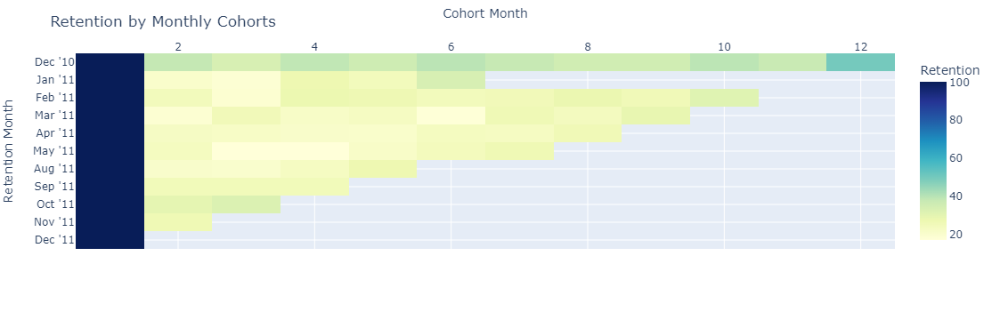

In [47]:
import plotly.express as px
import pandas as pd

month_list = ["Dec '10", "Jan '11", "Feb '11", "Mar '11", "Apr '11",
              "May '11", "Jan '11", "Aug '11", "Sep '11",
              "Oct '11", "Nov '11", "Dec '11"]

# Assuming you have 'retention' as a Pandas DataFrame containing the data

# Create the heatmap using Plotly Express
fig = px.imshow(
    retention,
    labels=dict(x="Cohort Month", y="Retention Month", color="Retention"),
    x=retention.columns,
    y=month_list,
    color_continuous_scale="YlGnBu",
)

# Customize the color scale and annotation
fig.update_xaxes(side="top")
fig.update_coloraxes(colorbar_title="Retention")
fig.update_traces(showscale=True)
fig.update_layout(
    title="Retention by Monthly Cohorts",
    xaxis_nticks=len(retention.columns),
)

# Show the plot
fig.show()







# Calculating average price per cohort:
* Calculate the average price metric and analyze if there are any differences in shopping patterns across time and across cohorts.

In [48]:
# create a groupby object and pass the monthly cohort and cohort index
grouping =cohort.groupby(['CohortMonth','CohortIndex'])
# Calculate the average of the unit price column
cohort_data =grouping['UnitPrice'].mean()
#Reset the index of cohort_data
cohort_data =cohort_data.reset_index()
# create a pivot
average_price =cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values='UnitPrice')
#average_price.round(1)
#average_price.index =average_price.index.date
average_price
#cohort_data
#cohort

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12
CohortMonth,,,,,,,,,,,,
2010-12-01,3.216682,3.182040,3.207467,3.603758,2.937803,4.996508,3.184572,3.235695,3.511560,3.035982,3.309705,2.835557
2011-01-01,3.505492,3.653572,3.069534,8.439024,3.157803,3.172919,2.918498,2.749649,2.641686,5.489040,2.886220,NaN
2011-02-01,3.355968,4.469638,4.824106,3.150045,2.987616,2.792577,2.812985,3.214380,2.894988,2.946092,NaN,NaN
2011-03-01,3.302802,4.990095,3.655094,3.289768,3.616562,2.758381,2.843273,2.809136,2.707846,NaN,NaN,NaN
2011-04-01,3.431172,3.958074,3.300128,2.673439,3.028297,2.867185,2.902668,2.812492,NaN,NaN,NaN,NaN
2011-05-01,4.662054,3.243691,2.652761,3.167391,2.667158,2.495751,2.615408,NaN,NaN,NaN,NaN,NaN
2011-06-01,10.490030,3.205283,3.343994,2.835952,2.553037,3.550657,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,4.493676,3.480495,2.752121,2.701985,2.403989,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,3.028246,5.425904,5.714033,7.046410,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


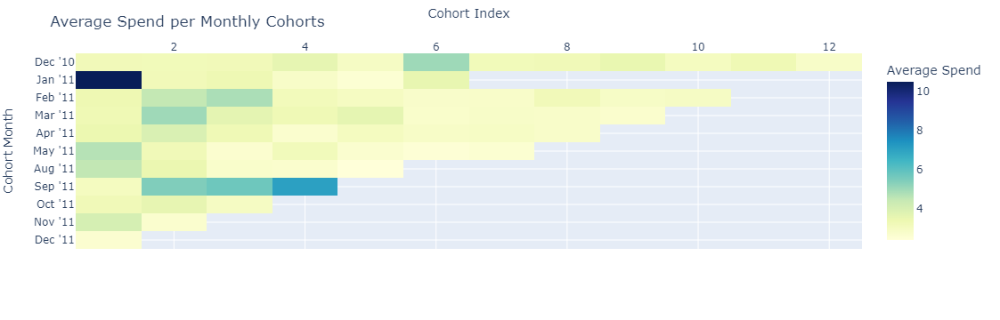

In [49]:
import plotly.express as px


# Create the heatmap using Plotly Express
fig = px.imshow(
    average_price,
    labels=dict(x="Cohort Index", y="Cohort Month", color="Average Spend"),
    x=average_price.columns,
    y=month_list,
    color_continuous_scale="YlGnBu",
)

# Customize the color scale and annotation
fig.update_xaxes(side="top")
fig.update_coloraxes(colorbar_title="Average Spend")
fig.update_traces(showscale=True)
fig.update_layout(
    title='Average Spend per Monthly Cohorts',
    xaxis_nticks=len(average_price.columns),
)

# Show the plot
fig.show()





* Calculate average quantity per cohort
*Calculate the average quantity metric and anayze if there are any differences in shopping patterns across cohorts. 

In [50]:
# Create a groupby object and pass the monthly cohort and cohort index as list
grouping =cohort.groupby(['CohortMonth','CohortIndex'])
# Calculate the average of the Quantity column
cohort_data =grouping['Quantity'].mean()
# Reset the index of cohort_data
cohort_data =cohort_data.reset_index()
#Create a pivot 
average_quantity =cohort_data.pivot(index='CohortMonth',columns='CohortIndex',values='Quantity')
average_quantity.round(1)
average_quantity.index =average_quantity.index.date
average_quantity

CohortIndex,1,2,3,4,5,6,7,8,9,10,11,12
2010-12-01,11.200463,14.691852,15.108447,14.954097,13.054649,14.416287,15.306910,14.879447,16.764934,16.809158,17.528956,13.019471
2011-01-01,10.127231,12.704190,12.429557,11.032382,12.288608,15.006101,14.302480,14.519414,11.451025,9.982762,9.256968,NaN
2011-02-01,10.924450,12.251366,18.563808,12.018144,11.167271,11.476727,13.378526,12.448602,10.381961,12.043074,NaN,NaN
2011-03-01,9.818050,9.972109,12.249296,9.483094,13.037510,12.369617,13.221102,12.263293,10.662973,NaN,NaN,NaN
2011-04-01,9.803935,10.130252,9.432453,11.622102,11.645560,8.315994,9.777895,9.480778,NaN,NaN,NaN,NaN
2011-05-01,10.977360,9.138087,14.023864,11.805435,10.973613,8.740725,10.275862,NaN,NaN,NaN,NaN,NaN
2011-06-01,10.411028,13.859783,10.509642,13.384102,10.360800,9.901184,NaN,NaN,NaN,NaN,NaN,NaN
2011-07-01,9.804225,12.700952,7.229385,7.929151,6.101961,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-08-01,9.941459,5.983114,5.371409,5.972992,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2011-09-01,12.003023,5.551129,7.657590,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


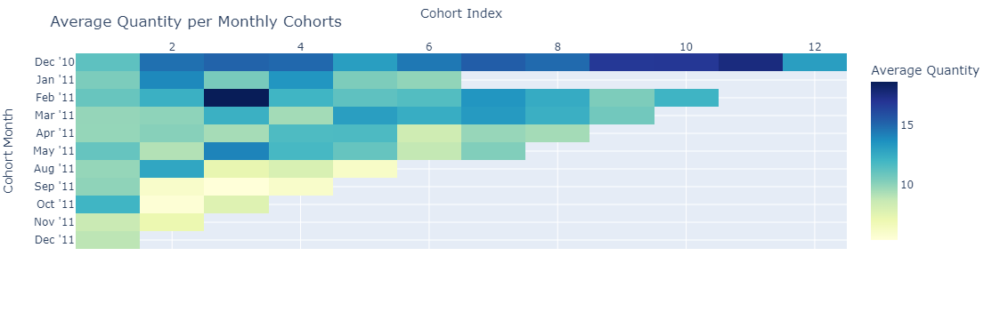

In [51]:
import plotly.express as px

# Assuming you have 'average_quantity' as a Pandas DataFrame containing the data
# and 'month_list' as a list of month labels

# Create the heatmap using Plotly Express
fig = px.imshow(
    average_quantity,
    labels=dict(x="Cohort Index", y="Cohort Month", color="Average Quantity"),
    x=average_quantity.columns,
    y=month_list,
    color_continuous_scale="YlGnBu",  # Use a valid predefined colorscale
)

# Customize the color scale and annotation
fig.update_xaxes(side="top")
fig.update_coloraxes(colorbar_title="Average Quantity")
fig.update_traces(showscale=True)
fig.update_layout(
    title='Average Quantity per Monthly Cohorts',
    xaxis_nticks=len(average_quantity.columns),
)

# Show the plot
fig.show()



# Project Task: 
# Data Modeling :
* 1. Build a RFM (Recency Frequency Monetary) model. Recency means the number of days since a customer made the last purchase. Frequency is the number of purchase in a given period. It could be 3 months, 6 months or 1 year. Monetary is the total amount of money a customer spent in that given period. Therefore, big spenders will be differentiated among other customers such as MVP (Minimum Viable Product) or VIP.



$Note:$ Rate “recency" for customer who has been active more recently higher than the less recent customer, because each company wants its customers to be recent.


$Note:$ Rate “frequency" and “monetary" higher, because the company wants the customer to visit more often and spend more money




# What is RFM?


RFM is a method used to analyze customer value. RFM stands for RECENCY, Frequency, and Monetary.
RECENCY: How recently did the customer visit our website or how recently did a customer purchase?
Frequency: How often do they visit or how often do they purchase?
Monetary: How much revenue we get from their visit or how much do they spend when they purchase?
For example, if we see the sales data in the last 12 months, the RFM will look something like below
 
# Why is it needed?
RFM Analysis is a marketing framework that is used to understand and analyze customer behaviour based on the above three factors RECENCY, Frequency, and Monetary.

### RFM Analysis 
RFM analysis is a customer segmentation technique that uses past purchase behavior to divide customers into groups. RFM helps divide customers into various categories or clusters to identify customers who are more likely to respond to promotions and also for future personalization services.

#### **Recency (R):** 
Time since last purchase

#### **Frequency (F):**  
Total number of purchases

#### **Monetary (M):** 
Total purchase value

#### **Benefits of RFM analysis** 
Increased customer retention
Increased response rate
Increased conversion rate
Increased revenue

To perform RFM analysis, we divide customers into four equal groups according to the distribution of values for recency, frequency, and monetary value. Four equal groups across three variables create 64 (4x4x4) different customer segments, which is a manageable number.

For example, let’s look at a customer who:
is within the group who purchased most recently (R=4),
is within the group who purchased most quantity (F=4),
is within the group who spent the most (M=4)
This customer belongs to RFM segment 4-4-4 (Best Customers), (R=4, F=4, M=4)


In [52]:
Segment =  ['Platinum Customers',
                     'Big Spenders',
                     'High Spend New Customers',
                     'Lowest-Spending Active Loyal Customers',
                     'Recent Customers',
                     'Good Customers Almost Lost', 
                     'Churned Best Customers',
                     'Lost Cheap Customers ']
RFM = [ 
               ['444', '443'],
               ['114', '124', '134', '144', '214', '224', '234', '244', '314', '324', '334', '344', '414', '424', '434', '444'],
               ['413', '314', '313', '414'],
               ['331', '341', '431', '441'],
               ['422', '423', '424', '432', '433', '434', '442', '443', '444'], 
               ['244', '234', '243', '233'], 
               ['144', '134', '143', '133'], 
               ['122', '111', '121', '112', '221', '212', '211']
               ]
# Create a dictionary for each segment to map them against each customer
Description = ['Customers who bought most recently, most often and spend the most',
               'Customers who spend the most',
               'New Customers who spend the most',
               'Active Customers who buy very often but spend less ',
               'Customers who have purchased recently',
               'Customers who were frequent and good spenders who are becoming very inactive',
               'Customers who were frequent and good spenders who are lost contributing to attrition',
               'Customers who purchased long ago , less frequent and very little']

Marketing = ['No price incentives, New products and Loyalty Programs',
                      'Market your most expensive products',
                      'Price Incentives',
                      'Promote economical cost effective products in daily use',
                      'Discounts and promote a variety of product sells',
                      'Aggressive Price Incentives',
                      'Monitor close communication with customers with constant feedback and rework ',
                      'Dont spend too much time to re-acquire',
                      ]
rfm_segments = pd.DataFrame({'Segment': Segment , 'RFM' : RFM , 'Description': Description, 'Marketing': Marketing})
rfm_segments

,Segment,RFM,Description,Marketing
0,Platinum Customers,"[444, 443]","Customers who bought most recently, most often...","No price incentives, New products and Loyalty ..."
1,Big Spenders,"[114, 124, 134, 144, 214, 224, 234, 244, 314, ...",Customers who spend the most,Market your most expensive products
2,High Spend New Customers,"[413, 314, 313, 414]",New Customers who spend the most,Price Incentives
3,Lowest-Spending Active Loyal Customers,"[331, 341, 431, 441]",Active Customers who buy very often but spend ...,Promote economical cost effective products in ...
4,Recent Customers,"[422, 423, 424, 432, 433, 434, 442, 443, 444]",Customers who have purchased recently,Discounts and promote a variety of product sells
5,Good Customers Almost Lost,"[244, 234, 243, 233]",Customers who were frequent and good spenders ...,Aggressive Price Incentives
6,Churned Best Customers,"[144, 134, 143, 133]",Customers who were frequent and good spenders ...,Monitor close communication with customers wit...
7,Lost Cheap Customers,"[122, 111, 121, 112, 221, 212, 211]","Customers who purchased long ago , less freque...",Dont spend too much time to re-acquire


The RFM values can be grouped in several ways:

* 1.Percentiles e.g. quantiles

* 2.Pareto 80/20 cut

* 3.Custom - based on business knowledge

We are going to implement percentile-based grouping.

Process of calculating percentiles:

Sort customers based on that metric
Break customers into a pre-defined number of groups of equal size
Assign a label to each group

In [53]:
retail_data.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'InvoiceMonth', 'TotalPrice'],
      dtype='object')

In [54]:
retail_data['Total Sum']= retail_data['UnitPrice']*retail_data['Quantity']

In [55]:
# Data Preparation 
import datetime as dt
print('Min Invoice Date:',retail_data.InvoiceDate.dt.date.min(),'Max Invoice Date:',
    retail_data.InvoiceDate.dt.date.max())
retail_data.head()

Min Invoice Date: 2010-12-01 Max Invoice Date: 2011-11-30


,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,Total Sum
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34


$Note:$In the real world, we would be working with the most recent snapshot of the data of today or yesterday.

In [56]:
retail_data.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'InvoiceMonth', 'TotalPrice',
       'Total Sum'],
      dtype='object')

In [57]:
cohort.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'InvoiceMonth', 'TotalPrice',
       'CohortMonth', 'CohortIndex'],
      dtype='object')

In [58]:
# lets set this date as the today"s date for further analysis
current_date =dt.date(2011,11,30)
current_date

datetime.date(2011, 11, 30)

In [59]:
# lets create a date column fr date values only
retail_data['Purchase_Date']=retail_data.InvoiceDate.dt.date
retail_data

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,Total Sum,Purchase_Date
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30,15.30,2010-12-01
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00,22.00,2010-12-01
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01
...,...,...,...,...,...,...,...,...,...,...,...,...
516379,C579886,22197,POPCORN HOLDER,-1,2011-11-30 17:39:00,0.85,15676.0,United Kingdom,2011-11-30,-0.85,-0.85,2011-11-30
516380,C579886,23146,TRIPLE HOOK ANTIQUE IVORY ROSE,-1,2011-11-30 17:39:00,3.29,15676.0,United Kingdom,2011-11-30,-3.29,-3.29,2011-11-30
516381,C579887,84946,ANTIQUE SILVER T-LIGHT GLASS,-1,2011-11-30 17:42:00,1.25,16717.0,United Kingdom,2011-11-30,-1.25,-1.25,2011-11-30
516382,C579887,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,-1,2011-11-30 17:42:00,7.95,16717.0,United Kingdom,2011-11-30,-7.95,-7.95,2011-11-30


In [60]:
snapshot_date = retail_data['InvoiceDate'].max() + dt.timedelta(days=1)
snapshot_date


Timestamp('2011-12-01 17:42:00')

$Note:$ The last day of purchase in total is 09 DEC, 2011. To calculate the day periods, 
* let's set one day after the last one,or 
* 10 DEC as a snapshot_date. We will cound the diff days with snapshot_date.

# 2.Calculate RFM metrics

Alternatively 
rfm =cohort.groupby(['CustomerID']).agg({'InvoiceDate':lambda x:(snapshot_date-x.max()).days,
                                        'InvoiceNo':'count','Total Sum':'sum'})
#Function Lambda: it gives the number of days between hypothetical today and the last  transaction 
#Rename columns
rfm.rename(columns={'InvoiceDate':'Recency','InvoiceNo':'Frequency','Total Sum':'Monetary Value'}
           ,inplace= True)

#Final RFM values
rfm.head()



# Recency
¶
Recency is about when was the last order of a customer. It means the number of days since a customer made the last purchase. If it’s a case for a website or an app, this could be interpreted as the last visit day or the last login time.

In [61]:
recency =retail_data.groupby('CustomerID')['Purchase_Date'].max().reset_index()
recency

,CustomerID,Purchase_Date
0,12346.0,2011-01-18
1,12347.0,2011-10-31
2,12348.0,2011-09-25
3,12349.0,2011-11-21
4,12350.0,2011-02-02
...,...,...
4326,18280.0,2011-03-07
4327,18281.0,2011-06-12
4328,18282.0,2011-08-09
4329,18283.0,2011-11-30


In [62]:
# creating a separate column for this date.
recency = recency.assign(Current_Date =current_date)
recency

,CustomerID,Purchase_Date,Current_Date
0,12346.0,2011-01-18,2011-11-30
1,12347.0,2011-10-31,2011-11-30
2,12348.0,2011-09-25,2011-11-30
3,12349.0,2011-11-21,2011-11-30
4,12350.0,2011-02-02,2011-11-30
...,...,...,...
4326,18280.0,2011-03-07,2011-11-30
4327,18281.0,2011-06-12,2011-11-30
4328,18282.0,2011-08-09,2011-11-30
4329,18283.0,2011-11-30,2011-11-30


In [63]:
#Compute the Number of days since last purchase
recency['Recency']=recency.Purchase_Date.apply(lambda x:(current_date-x).days)
current_date

datetime.date(2011, 11, 30)

In [64]:
recency.head()

,CustomerID,Purchase_Date,Current_Date,Recency
0,12346.0,2011-01-18,2011-11-30,316
1,12347.0,2011-10-31,2011-11-30,30
2,12348.0,2011-09-25,2011-11-30,66
3,12349.0,2011-11-21,2011-11-30,9
4,12350.0,2011-02-02,2011-11-30,301


In [65]:
# Drop the irrelevant Date Columns
recency.drop(['Purchase_Date','Current_Date'],axis=1,inplace=True)
recency

,CustomerID,Recency
0,12346.0,316
1,12347.0,30
2,12348.0,66
3,12349.0,9
4,12350.0,301
...,...,...
4326,18280.0,268
4327,18281.0,171
4328,18282.0,113
4329,18283.0,0


# Frequency
Frequency is about the number of purchase in a given period. It could be 3 months, 6 months or 1 year. So we can understand this value as for how often or how many a customer used the product of a company. The bigger the value is, the more engaged the customers are. Could we say them as our VIP? Not necessary. Cause we also have to think about how much they actually paid for each purchase, which means monetary value.

In [66]:
retail_data.columns

Index(['InvoiceNo', 'StockCode', 'Description', 'Quantity', 'InvoiceDate',
       'UnitPrice', 'CustomerID', 'Country', 'InvoiceMonth', 'TotalPrice',
       'Total Sum', 'Purchase_Date'],
      dtype='object')

In [67]:
frequency =retail_data.groupby('CustomerID').InvoiceNo.nunique().reset_index().rename(columns={'InvoiceNo':'Frequency'})
frequency.max()

CustomerID    18287.0
Frequency       238.0
dtype: float64

# Monetary
Monetary is the total amount of money a customer spent in that given period. Therefore big spenders will be differentiated with other customers such as MVP or VIP.

In [68]:
# Create a separate  column for Total Cost Uit Purchased
retail_data['Total_cost']= retail_data.Quantity *retail_data.UnitPrice
retail_data

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,Total Sum,Purchase_Date,Total_cost
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30,15.30,2010-12-01,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00,22.00,2010-12-01,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01,20.34
...,...,...,...,...,...,...,...,...,...,...,...,...,...
516379,C579886,22197,POPCORN HOLDER,-1,2011-11-30 17:39:00,0.85,15676.0,United Kingdom,2011-11-30,-0.85,-0.85,2011-11-30,-0.85
516380,C579886,23146,TRIPLE HOOK ANTIQUE IVORY ROSE,-1,2011-11-30 17:39:00,3.29,15676.0,United Kingdom,2011-11-30,-3.29,-3.29,2011-11-30,-3.29
516381,C579887,84946,ANTIQUE SILVER T-LIGHT GLASS,-1,2011-11-30 17:42:00,1.25,16717.0,United Kingdom,2011-11-30,-1.25,-1.25,2011-11-30,-1.25
516382,C579887,85048,15CM CHRISTMAS GLASS BALL 20 LIGHTS,-1,2011-11-30 17:42:00,7.95,16717.0,United Kingdom,2011-11-30,-7.95,-7.95,2011-11-30,-7.95


In [69]:
monetary =retail_data.groupby('CustomerID').Total_cost.sum().reset_index().rename(columns={'Total_cost':'Monetary'})
monetary.head()

,CustomerID,Monetary
0,12346.0,0.00
1,12347.0,4085.18
2,12348.0,1797.24
3,12349.0,1757.55
4,12350.0,334.40


In [70]:
# Lets combine all three to form an aggregated RFM Table
rf= recency.merge(frequency,on='CustomerID')
rfm = rf.merge(monetary, on ='CustomerID')

In [71]:
rfm.set_index('CustomerID',inplace=True)
rfm.head()

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,316,2,0.00
12347.0,30,6,4085.18
12348.0,66,4,1797.24
12349.0,9,1,1757.55
12350.0,301,1,334.40


$Note That:$
* We will rate "Recency" customer who have been active more recently better than the less recent customer,because each company wants its customers to be recent.

* We will rate "Frequency" and "Monetary Value" higher label because we want Customer to spend more money and visit more often(that is different order than recency).

# RFM Table integrity Check
Lets Check wheter he RFM table attributes are in conjuction with the original values:

In [72]:
rfm.index[1]

12347.0

In [73]:
# Fetch the records corressponding to the first customer id in above table
retail_data[retail_data.CustomerID== rfm.index[1]]

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,Total Sum,Purchase_Date,Total_cost
14938,537626,85116,BLACK CANDELABRA T-LIGHT HOLDER,12,2010-12-07 14:57:00,2.10,12347.0,Iceland,2010-12-07,25.2,25.2,2010-12-07,25.2
14939,537626,22375,AIRLINE BAG VINTAGE JET SET BROWN,4,2010-12-07 14:57:00,4.25,12347.0,Iceland,2010-12-07,17.0,17.0,2010-12-07,17.0
14940,537626,71477,COLOUR GLASS. STAR T-LIGHT HOLDER,12,2010-12-07 14:57:00,3.25,12347.0,Iceland,2010-12-07,39.0,39.0,2010-12-07,39.0
14941,537626,22492,MINI PAINT SET VINTAGE,36,2010-12-07 14:57:00,0.65,12347.0,Iceland,2010-12-07,23.4,23.4,2010-12-07,23.4
14942,537626,22771,CLEAR DRAWER KNOB ACRYLIC EDWARDIAN,12,2010-12-07 14:57:00,1.25,12347.0,Iceland,2010-12-07,15.0,15.0,2010-12-07,15.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...
428999,573511,22196,SMALL HEART MEASURING SPOONS,24,2011-10-31 12:25:00,0.85,12347.0,Iceland,2011-10-31,20.4,20.4,2011-10-31,20.4
429000,573511,22195,LARGE HEART MEASURING SPOONS,24,2011-10-31 12:25:00,1.65,12347.0,Iceland,2011-10-31,39.6,39.6,2011-10-31,39.6
429001,573511,20719,WOODLAND CHARLOTTE BAG,10,2011-10-31 12:25:00,0.85,12347.0,Iceland,2011-10-31,8.5,8.5,2011-10-31,8.5
429002,573511,23162,REGENCY TEA STRAINER,8,2011-10-31 12:25:00,3.75,12347.0,Iceland,2011-10-31,30.0,30.0,2011-10-31,30.0


 Check if the number difference of days from the purchase date in original record is same as shown in rfm dataset

In [74]:
(current_date-retail_data[retail_data.CustomerID==rfm.index[0]].iloc[0].Purchase_Date).days==rfm.iloc[0,0]

True

# Customer segments with RFM Model
The simplest way to create customers segments from RFM Model is to use Quantiles. We assign a score from 1 to 4 to Recency, Frequency and Monetary. Four is the best/highest value, and one is the lowest/worst value. A final RFM score is calculated simply by combining individual RFM score numbers.

In [75]:
# RFM Quantiles
quantile =rfm.quantile(q=[0.25,0.5,0.75])
quantile

,Recency,Frequency,Monetary
0.25,15.0,1.0,288.755
0.50,48.0,3.0,628.780
0.75,144.0,5.0,1545.905


In [76]:
# lets convert quartile information into a dictionary so that cutoff can be picked up.
quantile=quantile.to_dict()
quantile
rfm

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,316,2,0.00
12347.0,30,6,4085.18
12348.0,66,4,1797.24
12349.0,9,1,1757.55
12350.0,301,1,334.40
...,...,...,...
18280.0,268,1,180.60
18281.0,171,1,80.82
18282.0,113,2,98.76


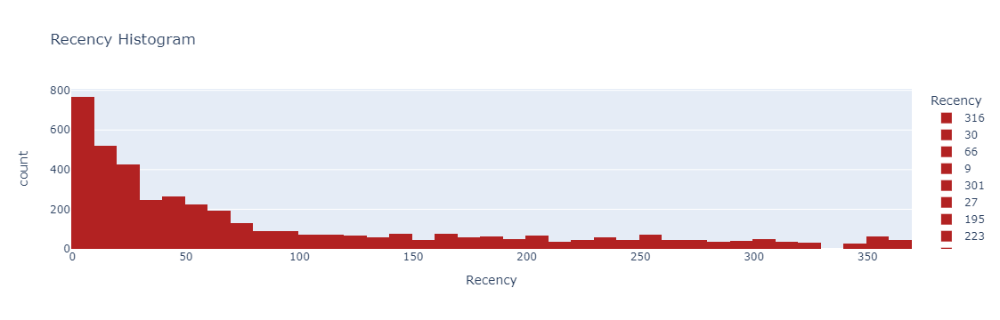

In [77]:
# Let us visualize the histogram charts for Recency Frequency and Monetary
import plotly.express as px

fig = px.histogram(rfm, x="Recency", nbins=50, color="Recency", title="Recency Histogram")
fig.update_traces(marker=dict(color='firebrick'))
fig.update_xaxes(title="Recency")
fig.show()

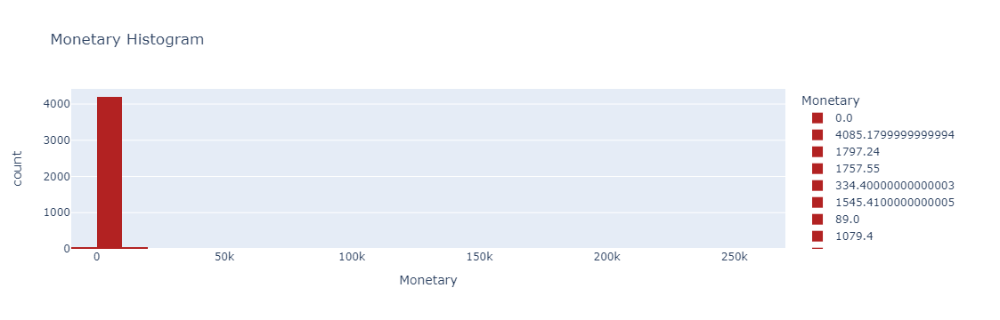

In [78]:
import plotly.express as px

fig = px.histogram(rfm, x="Monetary", nbins=50, color="Monetary", title="Monetary Histogram")
fig.update_traces(marker=dict(color='firebrick'))
fig.update_xaxes(title="Monetary")
fig.show()

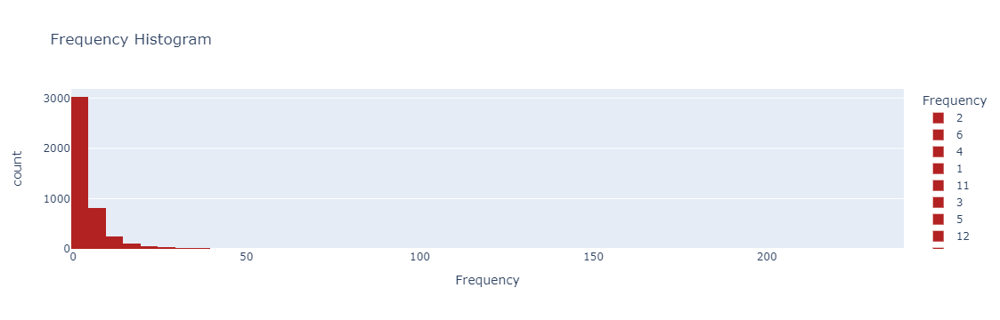

In [79]:
import plotly.express as px

fig = px.histogram(rfm, x="Frequency", nbins=50, color="Frequency", title="Frequency Histogram")
fig.update_traces(marker=dict(color='firebrick'))
fig.update_xaxes(title="Frequency")
fig.show()

$Interpretation:$ Hence from the graph we can observe that  highest recency (recently purchase around) is 3, monetary is 786 around 1 count and frequnecy 3 around 488.

#  3. Build RFM Segments. Give recency, frequency, and monetary scores individually by dividing them into quartiles.
* B1. Combine three ratings to get a RFM segment (as strings).
* B2. Get the RFM score by adding up the three ratings.
* B3. Analyze the RFM segments by summarizing them and comment on the findings.

For analysis it is critical to combine the scores to create a single score. There are few approaches. One approach is to just concatenate the scores to create a 3 digit number between 111 and 444. Here the drawback is too many categories (4x4x4).

In [80]:
# Arguments (x = value, p = recency, monetary_value, frequency, d = quantiles dict)
def RScore(x,p,d):
    if x <= d[p][0.25]:
        return 4
    elif x <= d[p][0.50]:
        return 3
    elif x <= d[p][0.75]: 
        return 2
    else:
        return 1
# Arguments (x = value, p = recency, monetary_value, frequency, k = quantiles dict)
def FMScore(x,p,d):
    if x <= d[p][0.25]:
        return 1
    elif x <= d[p][0.50]:
        return 2
    elif x <= d[p][0.75]: 
        return 3
    else:
        return 4
rfm_segment = rfm.copy()
rfm_segment['R_Quartile'] = rfm_segment['Recency'].apply(RScore, args=('Recency',quantile,))
rfm_segment['F_Quartile'] = rfm_segment['Frequency'].apply(FMScore, args=('Frequency',quantile,))
rfm_segment['M_Quartile'] = rfm_segment['Monetary'].apply(FMScore, args=('Monetary',quantile,))

In [81]:
rfm_segment.head()

,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile
CustomerID,,,,,,
12346.0,316,2,0.00,1,2,1
12347.0,30,6,4085.18,3,4,4
12348.0,66,4,1797.24,2,3,4
12349.0,9,1,1757.55,4,1,4
12350.0,301,1,334.40,1,1,2


In [82]:
rfm_segment[rfm_segment.Monetary==rfm_segment.Monetary.max()]
rfm_segment

,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile
CustomerID,,,,,,
12346.0,316,2,0.00,1,2,1
12347.0,30,6,4085.18,3,4,4
12348.0,66,4,1797.24,2,3,4
12349.0,9,1,1757.55,4,1,4
12350.0,301,1,334.40,1,1,2
...,...,...,...,...,...,...
18280.0,268,1,180.60,1,1,1
18281.0,171,1,80.82,1,1,1
18282.0,113,2,98.76,2,2,1


$Interpretation:$ 4331 rows has monetry  range as maximum.

$Note:$ for analysis it is critical to combine the scores to create a single score. there are few apporoches.
* one is to just concatenate the score to create 3 digit number between 111 and 444.
* second take the mean of recancy, frequency and monetary and define the ratings range accordingly using pd.qcut which is use to determine discrete values based on quantile.


here, i will be using 1st method but the drawback is many categries will be there (4x4x4)

# B1. Combine three ratings to get a RFM segment (as strings)

In [83]:
rfm_segment['RFMScore'] =rfm_segment.R_Quartile.map(str)\
+rfm_segment.F_Quartile.map(str)\
+ rfm_segment.M_Quartile.map(str)
rfm_segment.head()

,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore
CustomerID,,,,,,,
12346.0,316,2,0.00,1,2,1,121
12347.0,30,6,4085.18,3,4,4,344
12348.0,66,4,1797.24,2,3,4,234
12349.0,9,1,1757.55,4,1,4,414
12350.0,301,1,334.40,1,1,2,112


$Interpretation:$ henece we combined the recency quartile, frequence quartile and monetary quartile and name the new column RFMScore.

1.Best Recency score = 4 (most recently purchase)

2.Best Frequency score = 4 (most frequently purchase)

3.Best Monetary score = 4 (who spent the most)

# RFM Segment Allocation.

Lets define the customer segment best to our Knowledge basis RFM score and assign them to each customer respectively.

In [84]:
# Reset the index to create a customer_ID column
rfm_segment.reset_index(inplace=True)

In [85]:
import itertools

In [86]:
# Highest frequency as well as monetary value with least recencycy
platinium_customers =['444','443']
print("Platinium Customers:{}".format(platinium_customers))
# Get all combinations of [1,2,3,4] and length 2
big_spenders_combination =itertools.product([1,2,3,4],repeat=2)
#Print the obtained Combinations
big_spenders=[]
for i in list(big_spenders_combination):
    item =(list(i))
    item.append(4)
    big_spenders.append(("".join(map(str,item))))
print("Big Spenders:{}".format(big_spenders))
#High Spending New Customers-This group consists of those customers in 1-4-1 and 1-4-2.
#These are customers who transacted only once,but very recently and  they spent a lot
high_spend_new_customers =['413','314','313','414']
print("High Spend New Customers:{}".format(high_spend_new_customers))
print("High Spend New Customers:{}".format(high_spend_new_customers))
lowest_spending_active_loyal_customers_comb= itertools.product([3,4],repeat=2)
lowest_spending_active_loyal_customers =[]
for i in list (lowest_spending_active_loyal_customers_comb):
    item=(list(i))
    item.append(1)
    lowest_spending_active_loyal_customers.append(("".join(map(str,item))))
print ("Lowest Spending Active Loyal Customers : {}".format(lowest_spending_active_loyal_customers))

recent_customers_comb =  itertools.product([ 2,3,4], repeat = 2)
recent_customers = []
for i in list(recent_customers_comb): 
    item = (list(i))
    item.insert(0,4)
    recent_customers.append( ("".join(map(str,item))))
print ("Recent Customers: {}".format(recent_customers))




almost_lost = ['244', '234', '243', '233']        #  Low R - Customer's shopping less often now who used to shop a lot  
print ("Good Customers Almost Lost: {}".format(almost_lost)) 

churned_best_customers = ['144', '134' ,'143','133'] 
print ("Churned Best Customers: {}".format(churned_best_customers)) 


lost_cheap_customers = ['122','111' ,'121','112','221','212' ,'211'] # Customer's shopped long ago but with less frequency and monetary value
print ("Lost Cheap Customers: {}".format(lost_cheap_customers))


Platinium Customers:['444', '443']
Big Spenders:['114', '124', '134', '144', '214', '224', '234', '244', '314', '324', '334', '344', '414', '424', '434', '444']
High Spend New Customers:['413', '314', '313', '414']
High Spend New Customers:['413', '314', '313', '414']
Lowest Spending Active Loyal Customers : ['331', '341', '431', '441']
Recent Customers: ['422', '423', '424', '432', '433', '434', '442', '443', '444']
Good Customers Almost Lost: ['244', '234', '243', '233']
Churned Best Customers: ['144', '134', '143', '133']
Lost Cheap Customers: ['122', '111', '121', '112', '221', '212', '211']


In [87]:
# Create a dictionary for each segment to map them against each customer
segment_dict = {
    'Platinum Customers':platinium_customers,      
    'Big Spenders':      big_spenders,
    'High Spend New Customers':high_spend_new_customers,
    'Lowest-Spending Active Loyal Customers' : lowest_spending_active_loyal_customers ,
    'Recent Customers': recent_customers,
    'Good Customers Almost Lost':almost_lost,       
    'Churned Best Customers':   churned_best_customers, 
    'Lost Cheap Customers ': lost_cheap_customers, 
}

In [88]:
# Allocate  segment to each customer as per the RFM score mapping
def find_key(value):
    for k,v in segment_dict.items():
        if value in v:
            return k
rfm_segment['Segment'] = rfm_segment.RFMScore.map(find_key)

# Allocate all remaining customers to others segment category
rfm_segment.Segment.fillna('others', inplace=True)
rfm_segment.sample(10)


,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment
2133,15258.0,159,2,623.16,1,2,2,122,Lost Cheap Customers
2505,15758.0,15,1,205.25,4,1,1,411,others
3231,16763.0,176,2,594.90,1,2,2,122,Lost Cheap Customers
888,13534.0,23,42,5255.88,3,4,4,344,Big Spenders
3443,17053.0,119,2,496.38,2,2,2,222,others
2957,16384.0,80,2,584.50,2,2,2,222,others
1431,14298.0,21,43,50889.70,3,4,4,344,Big Spenders
2378,15594.0,6,6,1767.53,4,4,4,444,Platinum Customers
3854,17631.0,128,2,416.50,2,2,2,222,others
1963,15042.0,190,1,135.93,1,1,1,111,Lost Cheap Customers


$Interpretation:$ each rows based on the data has been segregated into  quantile r,f,m and srting segments 

Let's visualize different customer segments records in general to answers these questions for the retail business. 
Who are my best customers?
Who are the biggest spenders?
Which customers are at the verge of churning?
Who are lost customers that you don’t need to pay much attention to?
Who are your loyal customers?
Which customers you must retain?
Who has the potential to be converted in more profitable customers?
Which group of customers is most likely to respond to your current campaign?



In [89]:
# Best Customers who's recency, frequency as well as monetary attribute is highest.
rfm_segment[rfm_segment.RFMScore=='444'].sort_values('Monetary', ascending=False).head()

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment
1685,14646.0,7,74,267761.00,4,4,4,444,Platinum Customers
4193,18102.0,2,59,244952.95,4,4,4,444,Platinum Customers
3722,17450.0,1,54,185759.77,4,4,4,444,Platinum Customers
1876,14911.0,0,238,125482.36,4,4,4,444,Platinum Customers
54,12415.0,15,26,123725.45,4,4,4,444,Platinum Customers


In [90]:
# Biggest spenders
rfm_segment[rfm_segment.RFMScore=='334'].sort_values('Monetary', ascending=False).head()

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment
2765,16126.0,20,4,6287.77,3,3,4,334,Big Spenders
12,12359.0,48,5,6274.23,3,3,4,334,Big Spenders
727,13316.0,28,5,5570.69,3,3,4,334,Big Spenders
2894,16303.0,16,4,5305.83,3,3,4,334,Big Spenders
2868,16258.0,36,5,5203.51,3,3,4,334,Big Spenders


In [91]:
# customers that you must retain are those whose monetary and frequency was high but recency reduced quite a lot recently
rfm_segment[rfm_segment.RFMScore=='244'].sort_values('Monetary', ascending=False).head()

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment
457,12939.0,55,8,11581.80,2,4,4,244,Big Spenders
49,12409.0,69,7,11056.93,2,4,4,244,Big Spenders
2807,16180.0,91,10,10217.48,2,4,4,244,Big Spenders
1776,14769.0,68,9,10041.86,2,4,4,244,Big Spenders
3215,16745.0,77,18,7157.10,2,4,4,244,Big Spenders


In [92]:
rfm_segment.to_excel('RFM Segment.xlsx')

In [93]:
rfm_segment.Segment.value_counts()
rfm_segment.Recency

0       316
1        30
2        66
3         9
4       301
       ... 
4326    268
4327    171
4328    113
4329      0
4330     33
Name: Recency, Length: 4331, dtype: int64

# Summary metrics per RFM Score

In [94]:
rfm.columns

Index(['Recency', 'Frequency', 'Monetary'], dtype='object')

In [95]:
rfm_rfm = rfm[['Recency','Frequency','Monetary']]
print(rfm_rfm.describe())

           Recency    Frequency       Monetary
count  4331.000000  4331.000000    4331.000000
mean     90.277303     4.910875    1832.597551
std      99.389069     9.025901    7944.283177
min       0.000000     1.000000   -4287.630000
25%      15.000000     1.000000     288.755000
50%      48.000000     3.000000     628.780000
75%     144.000000     5.000000    1545.905000
max     364.000000   238.000000  267761.000000


# Project Task-3
1. Create clusters using k-means clustering algorithm.

* a. Prepare the data for the algorithm. If the data is asymmetrically distributed, manage the skewness with appropriate transformation. Standardize the data.

* b. Decide the optimum number of clusters to be formed.

* c. Analyze these clusters and comment on the results.


# 1. Create clusters using k-means clustering algorithm.

#  a. Prepare the data for the algorithm. If the data is asymmetrically distributed, manage the skewness with appropriate transformation. Standardize the data.

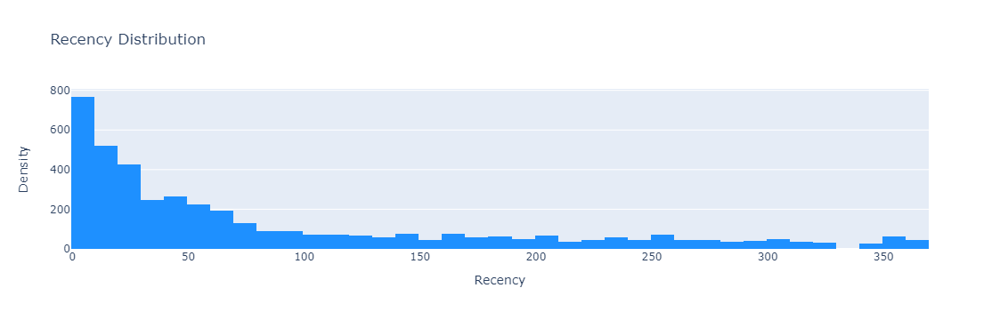

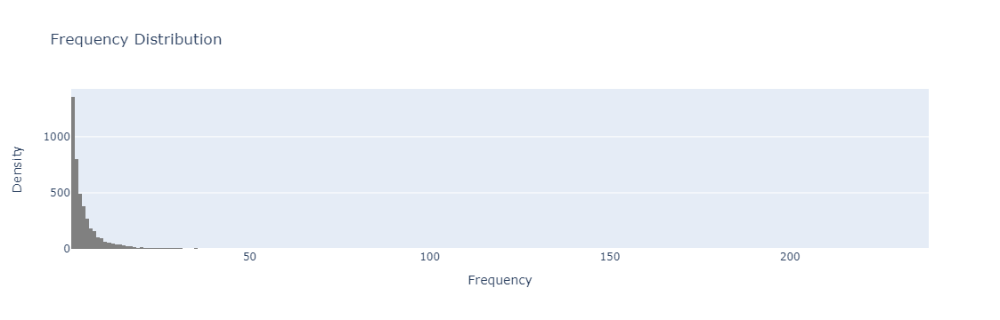

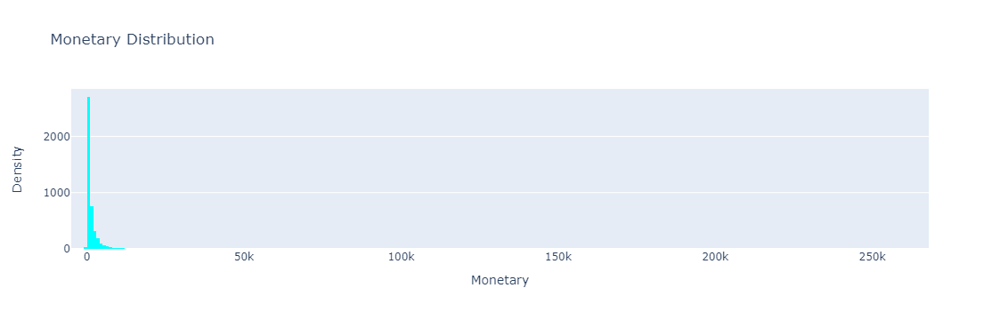

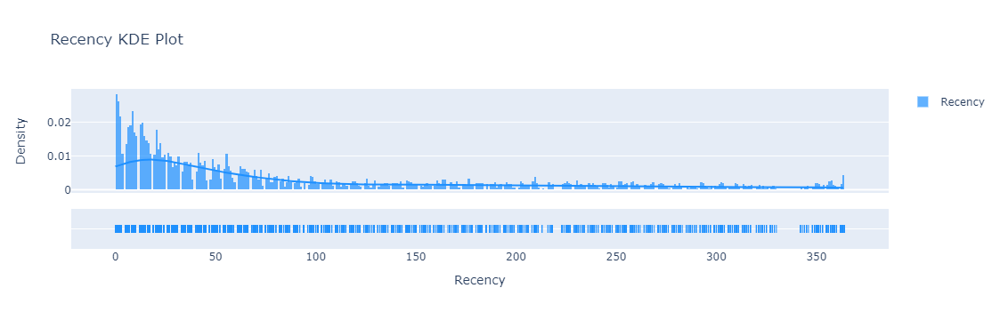

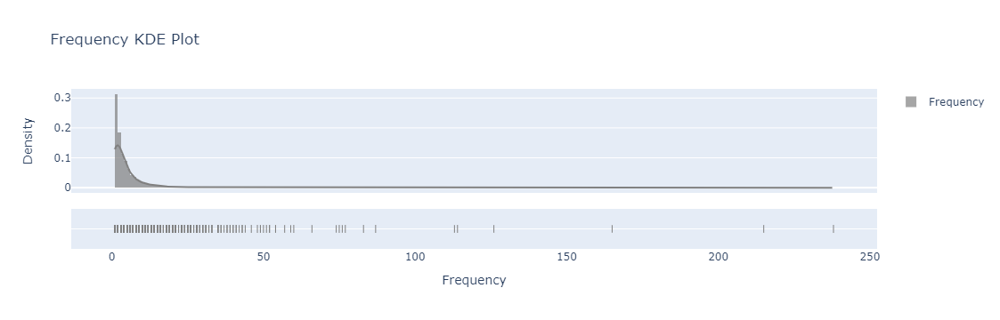

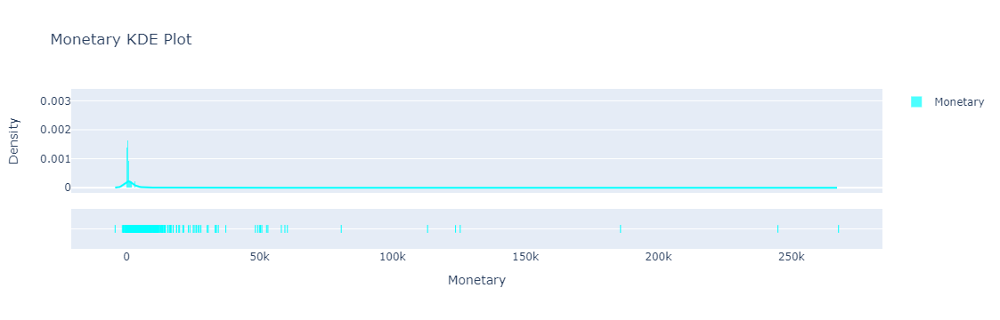

In [96]:
import plotly.express as px
import plotly.figure_factory as ff

# Histograms
histogram_recency = px.histogram(rfm, x="Recency", title="Recency Distribution", color_discrete_sequence=["dodgerblue"])
histogram_recency.update_xaxes(title_text="Recency")
histogram_recency.update_yaxes(title_text="Density")

histogram_frequency = px.histogram(rfm, x="Frequency", title="Frequency Distribution", color_discrete_sequence=["grey"])
histogram_frequency.update_xaxes(title_text="Frequency")
histogram_frequency.update_yaxes(title_text="Density")

histogram_monetary = px.histogram(rfm, x="Monetary", title="Monetary Distribution", color_discrete_sequence=["cyan"])
histogram_monetary.update_xaxes(title_text="Monetary")
histogram_monetary.update_yaxes(title_text="Density")

# KDE Plots
kde_recency = ff.create_distplot([rfm["Recency"]], group_labels=["Recency"], colors=["dodgerblue"])
kde_recency.update_layout(title="Recency KDE Plot", xaxis_title="Recency", yaxis_title="Density")

kde_frequency = ff.create_distplot([rfm["Frequency"]], group_labels=["Frequency"], colors=["grey"])
kde_frequency.update_layout(title="Frequency KDE Plot", xaxis_title="Frequency", yaxis_title="Density")

kde_monetary = ff.create_distplot([rfm["Monetary"]], group_labels=["Monetary"], colors=["cyan"])
kde_monetary.update_layout(title="Monetary KDE Plot", xaxis_title="Monetary", yaxis_title="Density")

# Show the plots
histogram_recency.show()
histogram_frequency.show()
histogram_monetary.show()
kde_recency.show()
kde_frequency.show()
kde_monetary.show()

$Interpretation:$  Here we obsevered the data is highly skewed so we have to transform and scale the data first because K-Means assumes that the variables should have a symmetric distribution (not skewed) and they should have same average values as well as same variance.

In [97]:
# Let's describe the table to see if there are any negative values 
rfm.describe()

,Recency,Frequency,Monetary
count,4331.000000,4331.000000,4331.000000
mean,90.277303,4.910875,1832.597551
std,99.389069,9.025901,7944.283177
min,0.000000,1.000000,-4287.630000
25%,15.000000,1.000000,288.755000
50%,48.000000,3.000000,628.780000
75%,144.000000,5.000000,1545.905000
max,364.000000,238.000000,267761.000000


$ Interpretation:$ We can observe that Monetary contains negative values. So first we need to make sure that minimum range of value starts from 1 otherwise log transformation may lead to errors in graph plotting as well as K-Means clustering. After that we will utilize log transformation and scaling to make data available for for K-Means clustering.

In [98]:
# create a copy of rfm 
rfm_scaled =rfm.copy()
# shift all the values in the column by adding absolute of minimum value to each value, thereby making each value positive
rfm_scaled.Monetary =rfm_scaled.Monetary + abs(rfm_scaled.Monetary.min()) +1
rfm_scaled.Recency =rfm_scaled.Recency + abs(rfm_scaled.Recency.min())+1

# check the summary of the new values
rfm_scaled.describe()

,Recency,Frequency,Monetary
count,4331.000000,4331.000000,4331.000000
mean,91.277303,4.910875,6121.227551
std,99.389069,9.025901,7944.283177
min,1.000000,1.000000,1.000000
25%,16.000000,1.000000,4577.385000
50%,49.000000,3.000000,4917.410000
75%,145.000000,5.000000,5834.535000
max,365.000000,238.000000,272049.630000


$Interpretation:$ Hence we can observe that the minimum value converted to 1.

In [99]:
# Transform the data before K-Means Clustering
from sklearn.preprocessing import StandardScaler
# Taking log first because normalization forces data for negative values
log_df =np.log(rfm_scaled)
# Normalize the data for uniform averages and means in the distributions.
scaler =StandardScaler()
normal_df =scaler.fit_transform(log_df)
normal_df =pd.DataFrame(data=normal_df,index=rfm.index,columns=rfm.columns)

In [100]:
normal_df

,Recency,Frequency,Monetary
CustomerID,,,
12346.0,1.386976,-0.369465,-0.687546
12347.0,-0.198501,0.790665,1.180610
12348.0,0.327082,0.362496,0.289615
12349.0,-0.970062,-1.101426,0.271348
12350.0,1.353919,-1.101426,-0.477924
...,...,...,...
18280.0,1.275007,-1.101426,-0.572384
18281.0,0.970027,-1.101426,-0.635422
18282.0,0.689543,-0.369465,-0.623983


Visualize the data after applying lograthmic transformation on the scaled data.
observe that  the skewness is reduced.

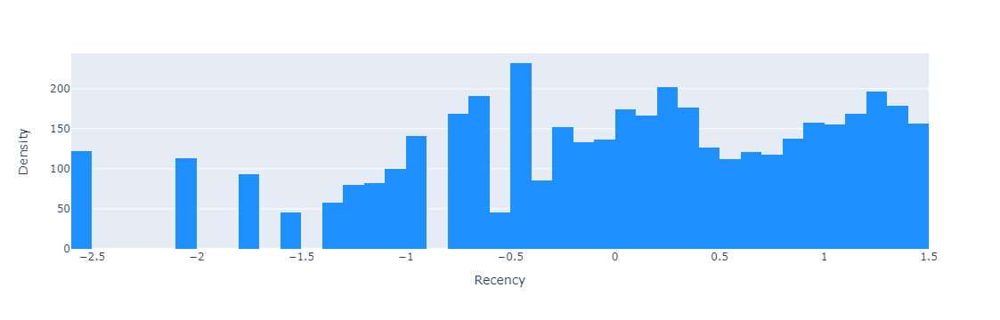

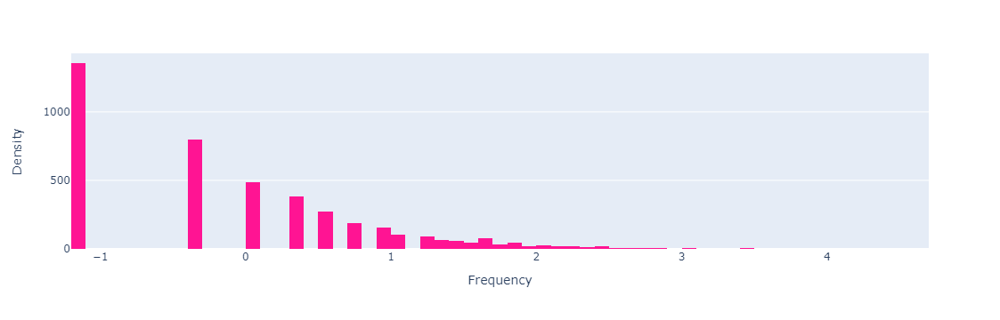

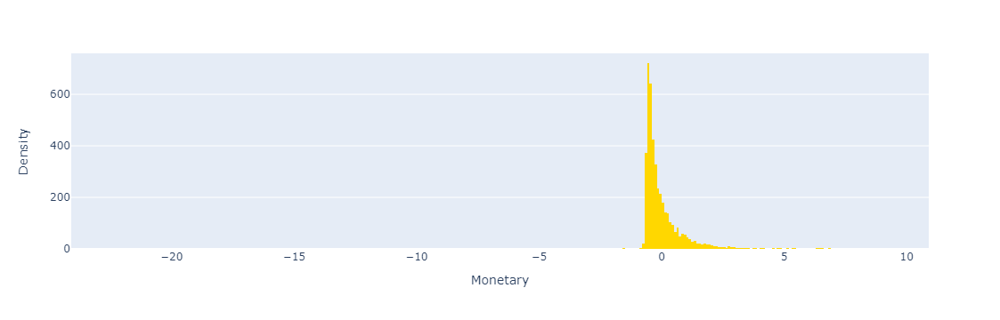

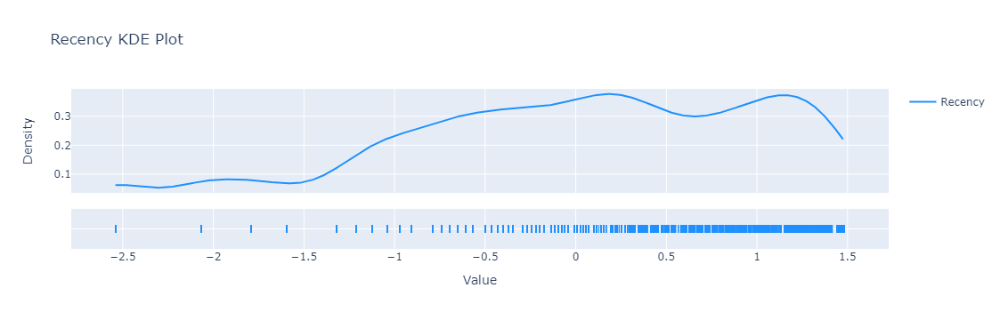

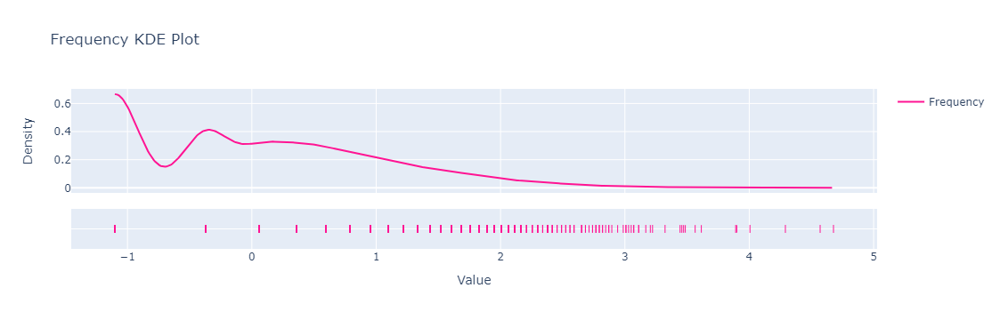

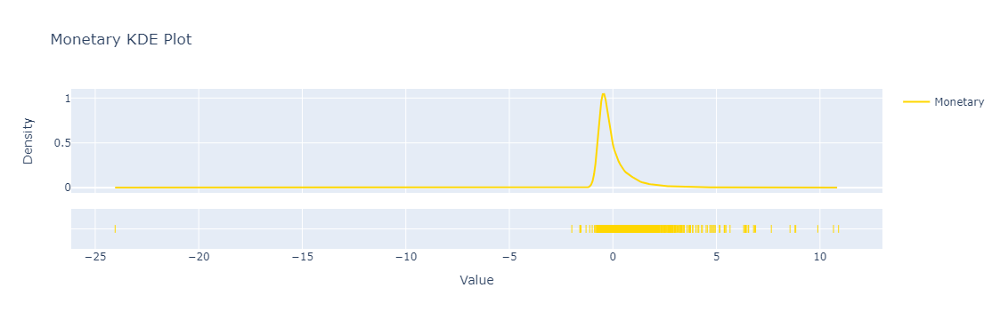

In [101]:
import plotly.express as px
import plotly.figure_factory as ff

# Create histograms
fig1 = px.histogram(normal_df, x="Recency", color_discrete_sequence=["dodgerblue"])
fig1.update_xaxes(title_text="Recency")
fig1.update_yaxes(title_text="Density")

fig2 = px.histogram(normal_df, x="Frequency", color_discrete_sequence=["deeppink"])
fig2.update_xaxes(title_text="Frequency")
fig2.update_yaxes(title_text="Density")

fig3 = px.histogram(normal_df, x="Monetary", color_discrete_sequence=["gold"])
fig3.update_xaxes(title_text="Monetary")
fig3.update_yaxes(title_text="Density")

# Create KDE plots
kde_fig1 = ff.create_distplot([normal_df["Recency"]], ["Recency"], colors=["dodgerblue"], show_hist=False)
kde_fig1.update_layout(title="Recency KDE Plot", xaxis_title="Value", yaxis_title="Density")

kde_fig2 = ff.create_distplot([normal_df["Frequency"]], ["Frequency"], colors=["deeppink"], show_hist=False)
kde_fig2.update_layout(title="Frequency KDE Plot", xaxis_title="Value", yaxis_title="Density")

kde_fig3 = ff.create_distplot([normal_df["Monetary"]], ["Monetary"], colors=["gold"], show_hist=False)
kde_fig3.update_layout(title="Monetary KDE Plot", xaxis_title="Value", yaxis_title="Density")

# Show the plots
fig1.show()
fig2.show()
fig3.show()
kde_fig1.show()
kde_fig2.show()
kde_fig3.show()


$Interpretation:$ we can observe that the means and averages are approximately uniformed now in each distribution. Now the data is apt for unsupervised algorithm i.e. K-Means.Lets  try to find number of appropriate  clusters to divide customers as per there spending pattern with elbow method first.

# b. Decide the optimum number of clusters to be formed.

# b.1. WCSS-Within Cluster Sum of Squares(WCSS).

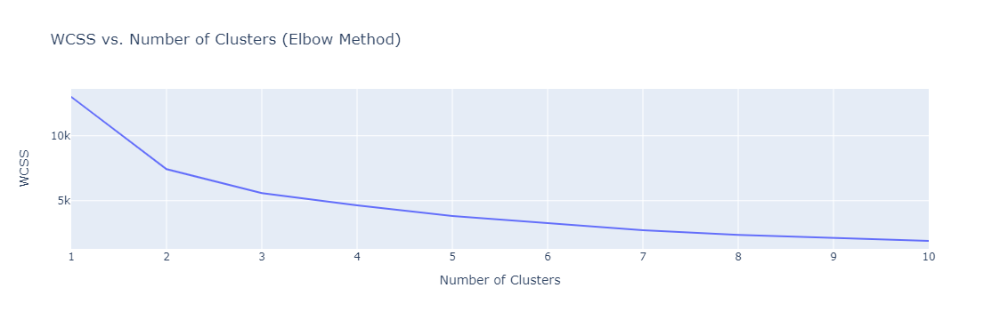

In [102]:
import plotly.express as px
from sklearn.cluster import KMeans

wcss = []

for i in range(1, 11):
    kmeans = KMeans(n_clusters=i, init='k-means++')
    kmeans.fit(normal_df)
    wcss.append(kmeans.inertia_)

fig = px.line(x=range(1, 11), y=wcss, title="WCSS vs. Number of Clusters (Elbow Method)")
fig.update_traces(marker=dict(symbol="circle", size=10))
fig.update_layout(
    xaxis_title="Number of Clusters",
    yaxis_title="WCSS",
    showlegend=False
)
fig.show()

In [103]:
ElbowPlot =pd.DataFrame({'Cluster':range(1,11),'SSE':wcss})
ElbowPlot.to_excel('Elbow Plot Data.xlsx')

# b2.Silhouette Score

Silhouette score for number of cluster(s)11:0.3557950595147287


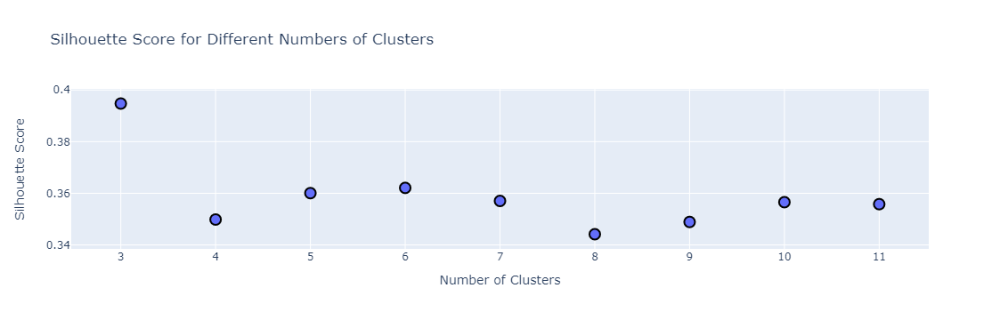

In [104]:
from sklearn.metrics import silhouette_score
wcss_silhouette=[]
for i in range(3,12):
    km=KMeans(n_clusters =i, random_state =0,init ='k-means++').fit(normal_df)
    preds= km.predict(normal_df)
    silhouette= silhouette_score(normal_df,preds)
    wcss_silhouette.append(silhouette)
print("Silhouette score for number of cluster(s){}:{}".format(i,silhouette))
    
df = pd.DataFrame({"Number of Clusters": range(3, 12), "Silhouette Score": wcss_silhouette})

fig = px.scatter(df, x="Number of Clusters", y="Silhouette Score", title="Silhouette Score for Different Numbers of Clusters")
fig.update_traces(marker=dict(size=12, line=dict(width=2, color='Black')))
fig.update_layout(
    xaxis_title="Number of Clusters",
    yaxis_title="Silhouette Score",
    showlegend=False,
)
fig.show()

$Interpretation:$ Here we can clearly see that optimum number of cluster should be 4 not 2 or 3.Because that is the only point after which the mean cluster distance looks to be plateaued after a steep downfall. So we will assume the 4 number of clusters as best for grouping of customer segments.

Now let's apply K-Means on 4 clusters to segregate the customer base.

In [105]:
kmeans= KMeans(n_clusters=4,random_state =1,init='k-means++')
kmeans.fit(normal_df)
cluster_labels =kmeans.labels_
kmeans

KMeans(n_clusters=4, random_state=1)

In [106]:
print(f"Shape of cluster label array is {cluster_labels.shape}")
print(f"Shape of RFM segment dataframe is{rfm_segment.shape}")

Shape of cluster label array is (4331,)
Shape of RFM segment dataframe is(4331, 9)


#  c. Analyze these clusters and comment on the results.

In [107]:
# Assign the Clusters as column to each customer
Cluster_table =rfm_segment.assign(Cluster =cluster_labels)

In [108]:
# Check counts of records assigned to different clusters
Cluster_table.Cluster.value_counts()

2    1941
3    1187
0    1013
1     190
Name: Cluster, dtype: int64

$Interpretation:$ Here we see that most of the customers belong to 0,2 and 3 cluster, wheras very less number of customers assigned to 1 cluster, may be possible that those are some of the best customers out of the pool or worst customers,lets checkout the pattern.

In [109]:
Cluster_table.sample(10)


,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment,Cluster
3345,16917.0,267,1,391.52,1,1,2,112,Lost Cheap Customers,2
4088,17951.0,30,4,990.84,3,3,3,333,others,0
3098,16584.0,71,3,908.03,2,2,3,223,others,2
260,12668.0,2,5,3772.35,4,3,4,434,Big Spenders,3
4174,18077.0,24,10,2329.07,3,4,4,344,Big Spenders,3
3277,16823.0,218,1,358.38,1,1,2,112,Lost Cheap Customers,2
2587,15867.0,13,14,3524.56,4,4,4,444,Platinum Customers,3
3609,17298.0,92,2,498.42,2,2,2,222,others,2
914,13576.0,1,20,6703.30,4,4,4,444,Platinum Customers,1
2707,16049.0,31,3,1074.81,3,2,3,323,others,0


In [110]:

print ("Platinum customers belong to cluster  : {} ".format(Cluster_table[Cluster_table['Segment']=='Platinum Customers']['Cluster'].unique()))
print ("Big Spenders belong to cluster  : {} ".format(Cluster_table[Cluster_table['Segment']=='Big Spenders']['Cluster'].unique()))
print ("High Spend new Customers belong to cluster  : {} ".format(Cluster_table[Cluster_table['Segment']=='High Spend New Customers']['Cluster'].unique()))
print ("Lowest-Spending Active Loyal Customers belong to cluster: {} ".format(Cluster_table[Cluster_table['Segment']=='Lowest-Spending Active Loyal Customers']['Cluster'].unique()))
print ("Recent Customers belong to cluster  : {} ".format(Cluster_table[Cluster_table['Segment']=='Recent Customers']['Cluster'].unique()))
print ("Good Customers Almost Lost belong to cluster : {} ".format(Cluster_table[Cluster_table['Segment']=='Good Customers Almost Lost']['Cluster'].unique()))
print ("Churned Best Customers belong to cluster : {} ".format(Cluster_table[Cluster_table['Segment']=='Churned Best Customers']['Cluster'].unique()))
print ("Lost Cheap customers belong to cluster  : {} ".format(Cluster_table[Cluster_table['Segment']=='Lost Cheap Customers ']['Cluster'].unique()))


Platinum customers belong to cluster  : [3 1] 
Big Spenders belong to cluster  : [3 0 2 1] 
High Spend new Customers belong to cluster  : [0 2] 
Lowest-Spending Active Loyal Customers belong to cluster: [0 3] 
Recent Customers belong to cluster  : [0 3] 
Good Customers Almost Lost belong to cluster : [2 3 0] 
Churned Best Customers belong to cluster : [2 3] 
Lost Cheap customers belong to cluster  : [2 0] 


$Interpretation:$ 
Here we can observe that RFM score is very low for customers in 0 & 3 cluster. Comparetivey, customers in 1&2 clusters have high RFM scores along with above average Recency and frequency values.

Let's checkout customers in each cluster more closely

In [111]:
Cluster_table[Cluster_table.Cluster==3].sample(5)

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment,Cluster
3905,17696.0,29,14,2201.05,3,4,4,344,Big Spenders,3
387,12840.0,134,6,2714.27,2,4,4,244,Big Spenders,3
2660,15984.0,62,8,2050.71,2,4,4,244,Big Spenders,3
2652,15974.0,30,8,3429.55,3,4,4,344,Big Spenders,3
2334,15532.0,16,6,1500.88,3,4,3,343,others,3


$Interpretation:$ Here it can be seen that the RFM score for Cluster 3 customers with low recency,good frequency and high monetary value.These are the loyal customers to the firm.

In [112]:
Cluster_table[Cluster_table.Cluster==2].sample(5)

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment,Cluster
1330,14155.0,257,1,118.75,1,1,1,111,Lost Cheap Customers,2
584,13120.0,229,1,30.60,1,1,1,111,Lost Cheap Customers,2
2752,16112.0,134,4,195.74,2,3,1,231,others,2
3009,16451.0,78,1,266.97,2,1,1,211,Lost Cheap Customers,2
865,13507.0,89,3,2022.79,2,2,4,224,Big Spenders,2


$Interpretation:$ Cluster 2 contains the highest number of customers who accounts for lowest value to the firm because there RFM values are lowest. Most of them are in the lost segment or on the verge of churning out.

In [113]:
Cluster_table[Cluster_table.Cluster==1].sample(5)

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment,Cluster
1110,13854.0,15,28,7722.74,4,4,4,444,Platinum Customers,1
848,13488.0,8,17,8910.61,4,4,4,444,Platinum Customers,1
3215,16745.0,77,18,7157.10,2,4,4,244,Big Spenders,1
1193,13969.0,7,17,7879.72,4,4,4,444,Platinum Customers,1
3914,17706.0,35,21,9321.53,3,4,4,344,Big Spenders,1


$Interpretation:$ Cluster 1 with very high monetary value along with good frequency and recency values. These are the most valuable customers to the firm. They should be looked after periodically to access there concerns.

In [114]:
Cluster_table[Cluster_table.Cluster == 0].sample(5)

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment,Cluster
2592,15877.0,8,1,239.31,4,1,1,411,others,0
347,12784.0,0,2,532.82,4,2,2,422,Recent Customers,0
684,13258.0,2,3,672.83,4,2,3,423,Recent Customers,0
2225,15385.0,31,1,316.88,3,1,2,312,others,0
3512,17155.0,8,2,251.70,4,2,1,421,others,0


In [115]:
Cluster_table.head()

,CustomerID,Recency,Frequency,Monetary,R_Quartile,F_Quartile,M_Quartile,RFMScore,Segment,Cluster
0,12346.0,316,2,0.00,1,2,1,121,Lost Cheap Customers,2
1,12347.0,30,6,4085.18,3,4,4,344,Big Spenders,3
2,12348.0,66,4,1797.24,2,3,4,234,Big Spenders,3
3,12349.0,9,1,1757.55,4,1,4,414,Big Spenders,0
4,12350.0,301,1,334.40,1,1,2,112,Lost Cheap Customers,2


$Interpretaion:$ Cluster 0 is somewhat average collectively can respond to the targeted campaigns.

#### Scatter Plot to visualize the division of customers into different segments based on the RFM atributes.

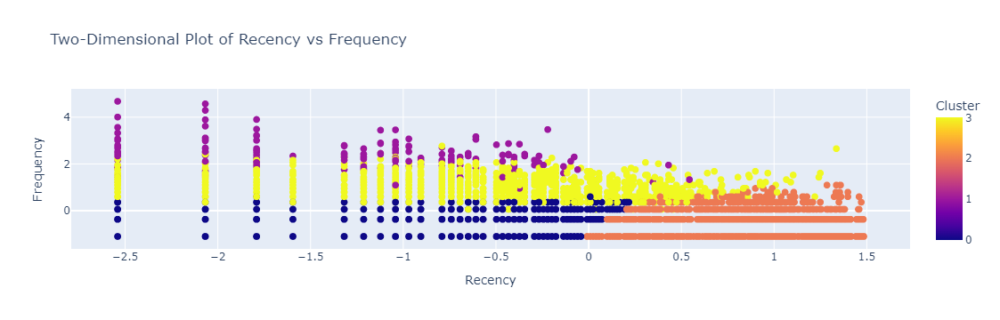

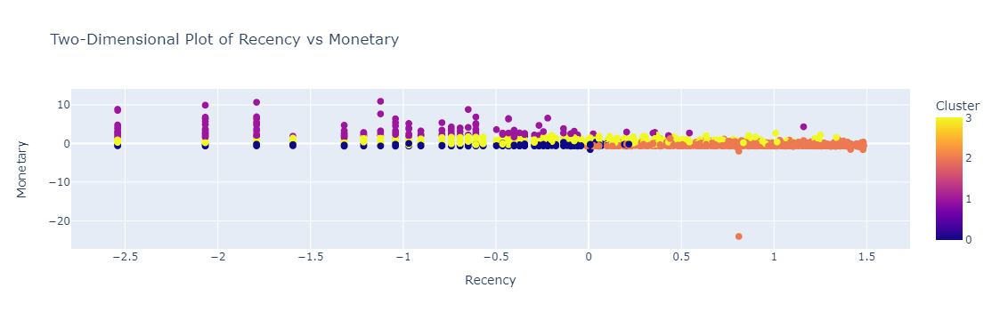

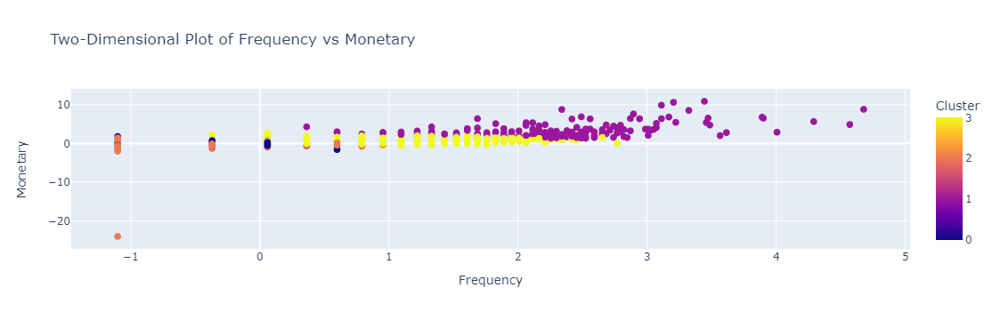

In [116]:
# Plotting two dimesional plots of each attributes respectively.
import plotly.express as px
X = normal_df.iloc[:, 0:3].values

cluster_labels = kmeans.labels_

attribute_names = normal_df.columns[:3]

for i in range(3):
    for j in range(i + 1, 3):
        df = pd.DataFrame({
            attribute_names[i]: X[:, i],
            attribute_names[j]: X[:, j],
            'Cluster': cluster_labels
        })

        fig = px.scatter(df, x=attribute_names[i], y=attribute_names[j], color='Cluster',
                         title=f'Two-Dimensional Plot of {attribute_names[i]} vs {attribute_names[j]}')

        fig.update_traces(marker=dict(size=8))
        fig.update_layout(showlegend=True)
        fig.show()

In [118]:
Cluster_table.to_excel('RFMSegment.xlsx')

Let's try to visualize this pattern through the help Clusters.

#### Heat Map
We will utilize heat map to visualize the relative importance of each attributes in all four customer segments i.e. clusters. It calculates importance score by dividing them and subtracting 1 (ensures 0 is returned when cluster average equals population average).

The farther a ratio is from 0, the more important that attribute is for a segment relative to the total population.



In [119]:
# Assign Cluster labels to RFM table
rfm_table_cluster = rfm.assign(Cluster = cluster_labels)

# Average attributes for each cluster
cluster_avg = rfm_table_cluster.groupby(['Cluster']).mean() 

# Calculate the population average
population_avg = rfm.mean()

# Calculate relative importance of attributes by 
relative_imp = cluster_avg / population_avg - 1


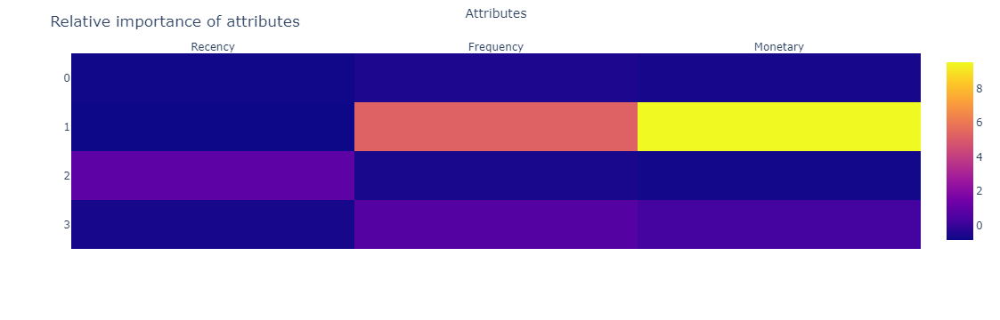

In [120]:
import plotly.express as px
import numpy as np

# Assuming you have a DataFrame named relative_imp
# This DataFrame should contain your data

fig = px.imshow(relative_imp.values, x=relative_imp.columns, y=relative_imp.index)
fig.update_xaxes(side="top")  # To have the x-axis labels at the top
fig.update_layout(
    title="Relative importance of attributes",
    xaxis_title="Attributes",
    yaxis_title="",
    yaxis=dict(tickmode='array', tickvals=np.arange(len(relative_imp.index)),
               ticktext=relative_imp.index),
)
fig.update_traces(text=relative_imp.values, colorbar=dict(title='Colorbar Title'))
fig.show()


### TABLEAU

#### Project Task: Week4
# Data Reporting:

* 1. Create a dashboard in tableau by choosing appropriate chart types and metrics useful for the business. The dashboard must entail the following:
* a. Country-wise analysis to demonstrate average spend. Use a bar chart to show the monthly figures
* b. Bar graph of top 15 products which are mostly ordered by the users to show the number of products sold
* c. Bar graph to show the count of orders vs. hours throughout the day
* d. Plot the distribution of RFM values using histogram and frequency charts
* e. Plot error (cost) vs. number of clusters selected
* f. Visualize to compare the RFM values of the clusters using heatmap

In [121]:
retail_data.to_excel("Retail_data_Tableau.xlsx")

In [122]:
retail_data.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country,InvoiceMonth,TotalPrice,Total Sum,Purchase_Date,Total_cost
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,2010-12-01 08:26:00,2.55,17850.0,United Kingdom,2010-12-01,15.30,15.30,2010-12-01,15.30
1,536365,71053,WHITE METAL LANTERN,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01,20.34
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,2010-12-01 08:26:00,2.75,17850.0,United Kingdom,2010-12-01,22.00,22.00,2010-12-01,22.00
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01,20.34
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,2010-12-01 08:26:00,3.39,17850.0,United Kingdom,2010-12-01,20.34,20.34,2010-12-01,20.34


[Click Here for Tableau dashboard]https://public.tableau.com/app/profile/zeba.khan6011/viz/StoryRetail/RETAILSTORY?publish=yes

## User Interactive Online Retail Story Board for UK Retail Store

   ### 1.  Retail Dashboard
        a.  Country Wise Analysis
        b. Top Products by Sales
        c. Top Products by Count
        d. Monthly Figures
        e.Count of orders Vs Hours Throughout the Day
        f. Elbow Plot -Error Cost against the no of clusters
        g. Recency Histogram
        h. Customer Segments
        i.FM Heat Map
        j. RM HEat Map

  ###  2. RFM Cluster Analysis Dashboard
        a. Geaographical Viz
        b. Cost Vs No of clusters
        c. Frequency Sum Vs Clusters
        d. RF Heat Map
        e. RF Plot
        f. FM Plot
        g. RM Plot
        h. Cluster View

In [2]:
!pip install Pillow

Defaulting to user installation because normal site-packages is not writeable
You should consider upgrading via the '/usr/local/bin/python3 -m pip install --upgrade pip' command.


$ Note:$ installing the pilow function to download and upload the image png file.

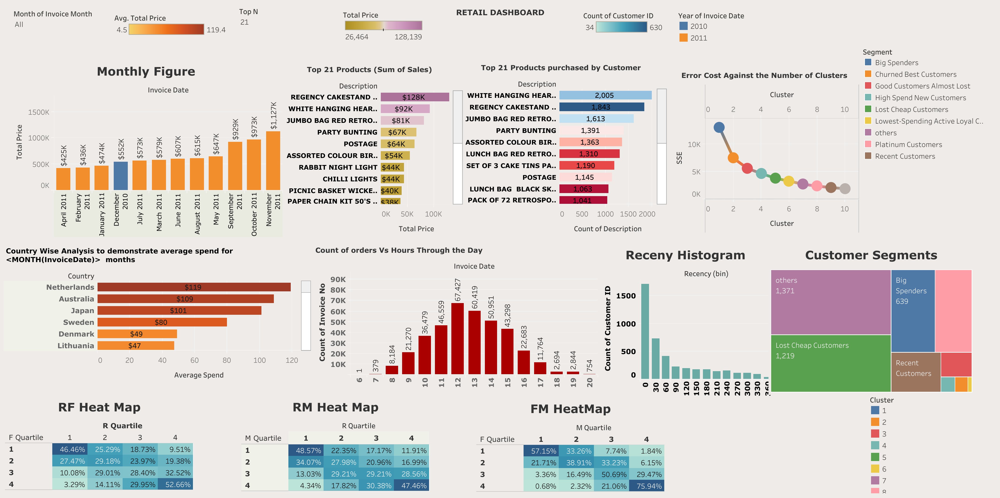

In [3]:
from PIL import Image
from IPython.display import display  # This is for Jupyter Notebook/Colab, you can skip it if not using these environments

# Open the PNG image
image1 = Image.open('RETAIL DASHBOARD.png')  # open the image Retail Dashboard with the path to your PNG file
image2 =Image.open('RETAIL STORY (1).png')
image3 =Image.open('RETAIL STORY.png')

# Display the image (for Jupyter Notebook/Colab)
display(image1)

# If not in a Jupyter environment, you can simply show the image using:
# image.show()

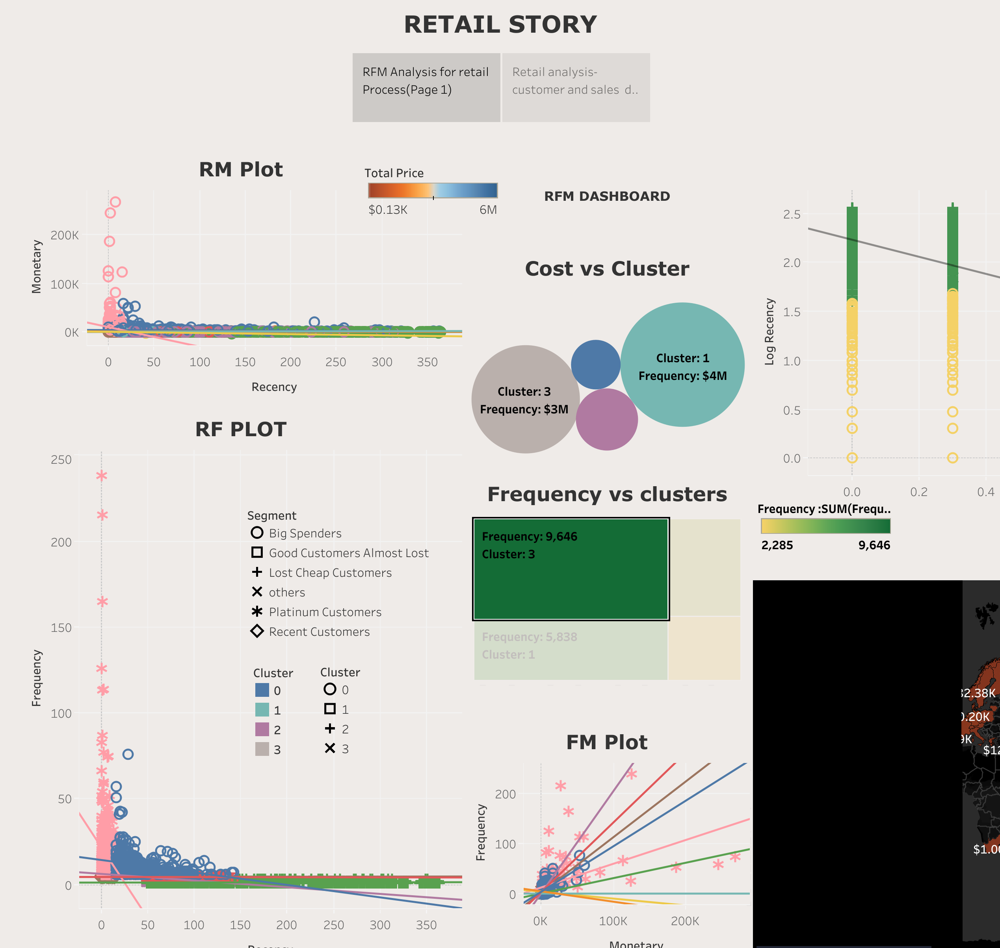

In [4]:
display(image2)

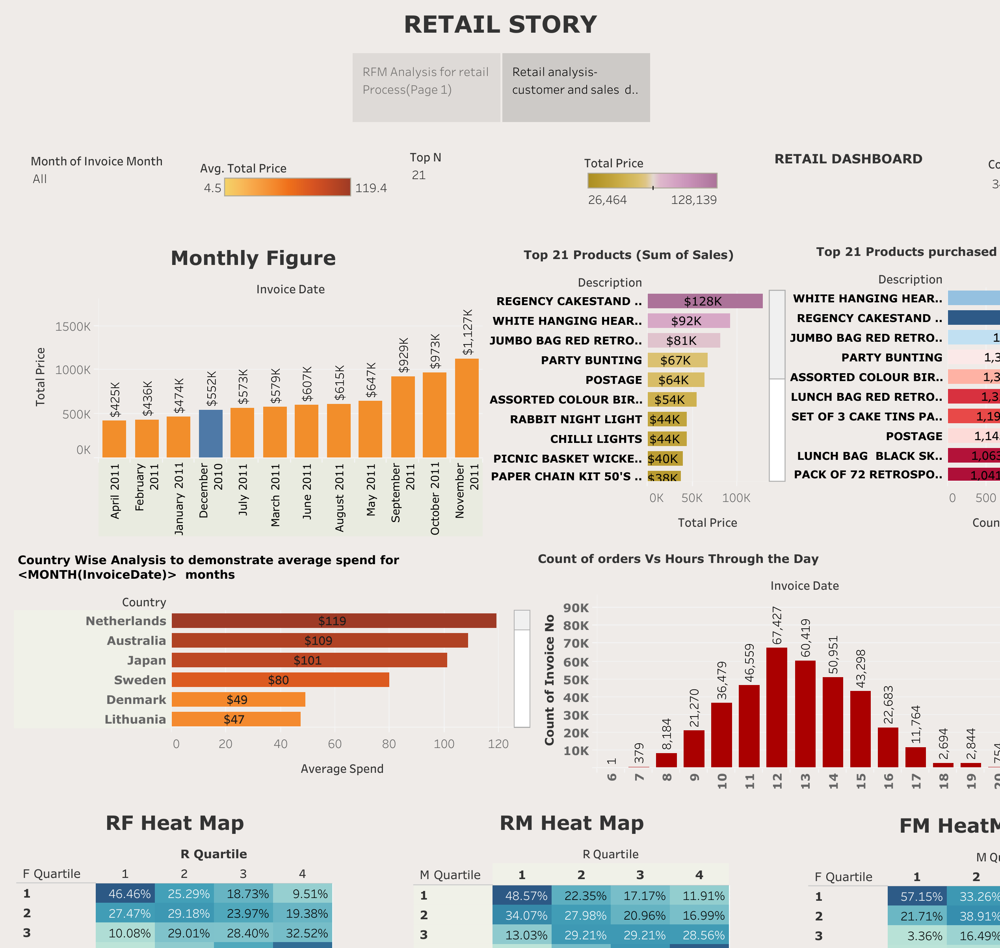

In [5]:
display(image3)

### Conclusion: